

---



---


  # **YZV 302E DEEP LEARNING TERM PROJECT**  

  ### Oğuz Kağan Pürçek - 150220759
  ### Umut Çalıkkasap - 150210721
---



---


               





### **What is Pneumonia?**

Pneumonia is a lung condition characterized by inflammation, primarily affecting the alveoli, which are the tiny air sacs in the lungs. Common symptoms include a dry or productive cough, chest pain, fever, and breathing difficulties, with the severity varying from mild to severe. The condition is typically caused by bacterial or viral infections, though it can also result from other microorganisms, certain medications, or underlying health issues like autoimmune diseases. Factors that increase the risk of pneumonia include cystic fibrosis, chronic obstructive pulmonary disease (COPD), asthma, diabetes, heart failure, smoking, impaired coughing ability (e.g., after a stroke), and weakened immunity. Diagnosis is often made based on symptoms and a physical exam, with tests like chest X-rays, blood tests, and sputum cultures aiding in confirmation. Pneumonia can also be categorized based on where it was contracted, such as in the community, a hospital, or other healthcare settings.


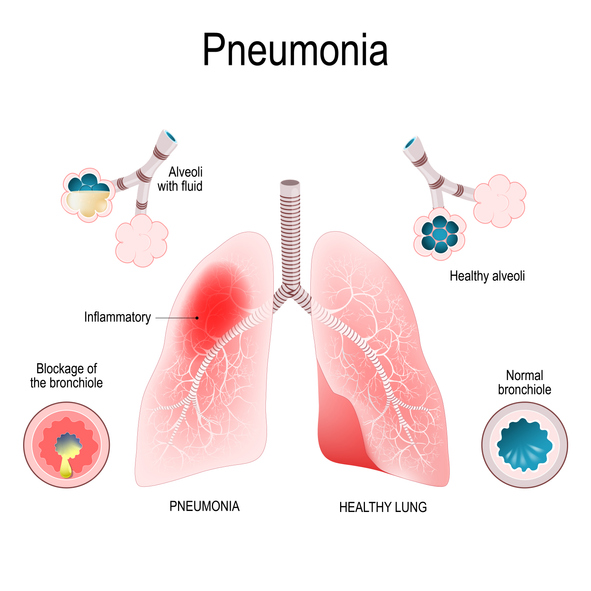

### **Chest X-ray Classification with Deep Learning**

This notebook demonstrates a comprehensive approach to classifying chest X-ray images into two categories: "Normal" and "Pneumonia". The primary goal is to build and evaluate deep learning models to automate the diagnostic process, providing insights into the application of machine learning in healthcare.

### **Objectives:**
1. **Data Preparation and Preprocessing**: Load, augment, and preprocess the dataset for model training.
2. **Model Definitions**: Utilize pre-trained architectures like ResNet, VGG16, EfficientNet, and a custom CNN.
3. **Training and Validation**: Implement training pipelines and monitor model performance metrics
4. **Visualization & Evaluation of Model**: Analyze model predictions through Grad-CAM, confusion matrices, and ROC curves.
5. **Real-World Testing**: Evaluate the trained models on unseen real-world datasets to assess their generalizability.
6. **Discussion**: Summarize findings, evaluate the limitations, and suggest potential improvements.

This notebook is divided into clear sections to make the workflow understandable and reproducible. By the end, the notebook will demonstrate the application of advanced deep learning techniques in medical image classification and the interpretation of their results.


### **Libraries**

In [ ]:
from torch.utils.data import DataLoader
from torchvision import transforms, datasets, models
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay
from collections import defaultdict
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from tqdm import tqdm
import seaborn as sns
import numpy as np
import pandas as pd
import os
import shutil
import time
import shap
from PIL import Image

## **STEP 1 : Data Preparation and Preprocessing**


This section focuses on preparing the chest X-ray dataset for training, validation, and testing. The following steps are performed:

These preprocessing steps ensure that the data is suitable for deep learning models and enhances their ability to generalize.



---



### **1. Data Accessing**:
The dataset is organized into "train," "validation," and "test" directories, each containing subdirectories for "Normal" and "Pneumonia" classes.


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


###**2. Data Augmentation and Normalization**:
   - Random Cropping and Resizing: Helps in generating diverse training samples to improve model generalization.
   - Horizontal Flipping: Simulates variations in image orientation.
   - Normalize images using mean and standard deviation values derived from the ImageNet dataset to align input distributions with pre-trained models.

In [ ]:
# Data augmentation and preprocessing
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),  # Randomly crop images to 224x224
        transforms.RandomHorizontalFlip(),  # Randomly flip images horizontally
        transforms.ColorJitter(brightness=0.2, contrast=0.2),
        transforms.RandomRotation(5),


        transforms.ToTensor(), # Convert images to PyTorch tensors
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize using ImageNet mean and std
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),  # Resize images to 256 pixels on the shorter side
        transforms.CenterCrop(224),  # Crop the center of the image to 224x224
        transforms.ToTensor(),  # Convert images to PyTorch tensors
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize using ImageNet mean and std
    ])
}

### **3. Data Loaders & Splitting**:



   - Training: Used to train the model parameters.
   - Validation: Monitor model performance during training to detect overfitting.
   - Testing: Evaluate the final model on unseen data.



In [ ]:
# Dataset definition
data_dir = '/content/drive/MyDrive/chest_xray-2'
train_dir = os.path.join(data_dir, 'train')
val_dir = os.path.join(data_dir, 'val')
test_dir = os.path.join(data_dir, 'test')

# Data loaders
train_loader = DataLoader(
    datasets.ImageFolder(train_dir, data_transforms['train']),
    batch_size=32, shuffle=True, num_workers=4, pin_memory=True
)
val_loader = DataLoader(
    datasets.ImageFolder(val_dir, data_transforms['val']),
    batch_size=32, shuffle=False, num_workers=4, pin_memory=True
)
test_loader = DataLoader(
    datasets.ImageFolder(test_dir, data_transforms['val']),
    batch_size=32, shuffle=False, num_workers=4, pin_memory=True
)

# Display dataset sizes
print(f"Training Dataset Size: {len(train_loader.dataset)}")
print(f"Validation Dataset Size: {len(val_loader.dataset)}")
print(f"Test Dataset Size: {len(test_loader.dataset)}")

Training Dataset Size: 5862
Validation Dataset Size: 1880
Test Dataset Size: 3313


## **STEP 2 : Model Definitions**



This section defines the architectures used in this project. The models include:

### **Models:**

1. **ResNet-18**:
   - A residual network that solves the vanishing gradient problem by introducing skip connections.
   - Ideal for medical images due to its ability to extract deep features.
2. **VGG16**:
   - A simpler, deep convolutional neural network with a straightforward architecture, known for its consistency in classification tasks.
3. **EfficientNet-B0**:
   - Combines scaling techniques (width, depth, resolution) to achieve state-of-the-art accuracy with low computational cost.
4. **Custom CNN**:
   - A lightweight convolutional network designed specifically for this dataset.
   - Includes fewer layers, making it efficient for smaller datasets.

Each architecture has been selected to evaluate how varying levels of complexity and pre-training influence model performance on medical data.

### **---> Transfer Learning and Fine-Tuning:**
- ResNet-18, VGG16, and EfficientNet models are initialized with pre-trained weights on ImageNet.
- Specific layers are fine-tuned to adapt the models to the chest X-ray dataset.


---


1. **ResNet-18**:
  - Pre-trained weights are used.
  - Only the final residual block and fully connected layers are fine-tuned.

2. **VGG16**:
  - Fine-tuning is applied to the last convolutional layers and the classifier.

3. **EfficientNet-B0**:
  - Only the last two feature blocks and the classifier are fine-tuned.

**Note:** Fine-tuning allows models to adapt to the dataset while leveraging pre-trained features, optimizing both performance and computational efficiency.

In [ ]:
from torchvision import models

def get_resnet(num_classes=2, pretrained=True):
    # Load ResNet-18
    model = models.resnet18(pretrained=pretrained)

    num_features = model.fc.in_features

    # Modify the fully connected layer
    model.fc = nn.Linear(num_features, num_classes)

    # Freeze all layers, unfreeze layer4 and fc
    for param in model.parameters():
        param.requires_grad = False
    for param in model.layer4.parameters():
        param.requires_grad = True
    for param in model.fc.parameters():
        param.requires_grad = True

    return model.to(device)

def get_vgg16(num_classes=2, pretrained=True):
    # Load VGG-16
    model = models.vgg16(pretrained=pretrained)

    num_features = model.classifier[6].in_features

    # Modify the classifier
    model.classifier[6] = nn.Linear(num_features, num_classes)

    # Unfreeze last convolutional layers and classifier
    for param in model.features[-4:].parameters():
        param.requires_grad = True
    for param in model.classifier.parameters():
        param.requires_grad = True

    return model.to(device)

def get_efficientnet(num_classes=2, pretrained=True):
    # Load EfficientNet-B0
    model = models.efficientnet_b0(pretrained=pretrained)

    num_features = model.classifier[1].in_features

    # Modify the classifier
    model.classifier[1] = nn.Linear(num_features, num_classes)

    # Freeze all layers, unfreeze last feature blocks and classifier
    for param in model.parameters():
        param.requires_grad = False
    for param in model.features[-2:].parameters():
        param.requires_grad = True
    for param in model.classifier.parameters():
        param.requires_grad = True

    return model.to(device)

def get_custom_cnn(num_classes=2, pretrained=False):
    model = nn.Sequential(
        nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),  # First convolutional layer
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2),
        nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),  # Second convolutional layer
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2),
        nn.Flatten(),  # Flatten for fully connected layers
        nn.Linear(64 * 56 * 56, 128),
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(128, num_classes)
    )
    return model.to(device)

## **STEP 3 : Training and Validation Functions**


The training process involves the following key components:


---


### **1. Training Epoch**:
   - Forward Pass: Input data is passed through the model to calculate predictions.
   - Loss Computation: The difference between predictions and ground truth labels is computed using Cross-Entropy Loss.
   - Backward Pass: Gradients are calculated and propagated to update model weights using the optimizer.

In [ ]:
def train_epoch(model, train_loader, criterion, optimizer):
    # Set the model to training mode
    model.train()

    running_loss = 0.0
    predictions = []
    targets = []

    # Progress bar for training
    pbar = tqdm(train_loader, desc='Training', leave=False)

    for inputs, labels in pbar:
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()  # Reset gradients
        outputs = model(inputs)  # Forward pass
        loss = criterion(outputs, labels)  # Compute loss
        loss.backward()  # Backward pass
        optimizer.step()  # Update weights

        running_loss += loss.item()
        _, preds = torch.max(outputs, 1)  # Get class predictions
        predictions.extend(preds.cpu().numpy())
        targets.extend(labels.cpu().numpy())

        # Update progress bar
        pbar.set_postfix({'loss': f'{loss.item():.4f}'})

    epoch_loss = running_loss / len(train_loader)
    epoch_acc = accuracy_score(targets, predictions)
    epoch_precision = precision_score(targets, predictions, average='binary')
    epoch_recall = recall_score(targets, predictions, average='binary')

    return {
        'loss': epoch_loss,
        'accuracy': epoch_acc,
        'precision': epoch_precision,
        'recall': epoch_recall
    }

### **2. Validation**:
   - Performed after each training epoch to evaluate the model on unseen validation data.
   - Metrics monitored include accuracy, precision, recall, and F1-score to ensure a balanced evaluation of performance.

In [ ]:
def validate_epoch(model, val_loader, criterion):
    # Set the model to evaluation mode
    model.eval()

    running_loss = 0.0
    predictions = []
    targets = []

    # Progress bar for validation
    pbar = tqdm(val_loader, desc='Validating', leave=False)

    with torch.no_grad():  # Disable gradient computation
        for inputs, labels in pbar:
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            _, preds = torch.max(outputs, 1)  # Get class predictions
            predictions.extend(preds.cpu().numpy())
            targets.extend(labels.cpu().numpy())

            pbar.set_postfix({'val_loss': f'{loss.item():.4f}'})

    epoch_loss = running_loss / len(val_loader)
    epoch_acc = accuracy_score(targets, predictions)
    epoch_precision = precision_score(targets, predictions, average='binary')
    epoch_recall = recall_score(targets, predictions, average='binary')

    return {
        'loss': epoch_loss,
        'accuracy': epoch_acc,
        'precision': epoch_precision,
        'recall': epoch_recall
    }

### **3. Train Model & Checking for Early Stopping**:
   - (Optional) Stops training when the validation loss does not improve for a specified number of epochs, preventing overfitting.

These functions form the backbone of the training pipeline, ensuring that the models are optimized effectively.

In [ ]:
def train_model(model, train_loader, val_loader, test_loader, num_epochs=10, patience=5):
    # Loss function
    criterion = nn.CrossEntropyLoss()

    # Optimizer with weight decay
    optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()),
                            lr=1e-4, weight_decay=0.01)

    # Learning rate scheduler
    scheduler = optim.lr_scheduler.OneCycleLR(optimizer, max_lr=1e-3,
                                               epochs=num_epochs,
                                               steps_per_epoch=len(train_loader))

    history = defaultdict(list)
    best_val_loss = float('inf')  # Initialize with a very high value
    patience_counter = 0  # Counter for early stopping

    for epoch in range(num_epochs):
        print(f'\nEpoch {epoch+1}/{num_epochs}')
        total_batches = len(train_loader)

        # Training phase
        start_time = time.time()
        train_metrics = train_epoch(model, train_loader, criterion, optimizer)

        # Validation phase
        val_metrics = validate_epoch(model, val_loader, criterion)
        scheduler.step()

        # Save metrics for visualization
        history['train_loss'].append(train_metrics['loss'])
        history['val_loss'].append(val_metrics['loss'])
        history['train_accuracy'].append(train_metrics['accuracy'])
        history['val_accuracy'].append(val_metrics['accuracy'])
        history['train_precision'].append(train_metrics['precision'])
        history['train_recall'].append(train_metrics['recall'])
        history['val_precision'].append(val_metrics['precision'])
        history['val_recall'].append(val_metrics['recall'])

        # Check for early stopping
        if val_metrics['loss'] < best_val_loss:  # If validation loss improves
            best_val_loss = val_metrics['loss']
            patience_counter = 0  # Reset patience counter
            best_model_state = model.state_dict()  # Save best model state
        else:
            patience_counter += 1
            print(f"Early stopping patience: {patience_counter}/{patience}")
            if patience_counter >= patience:
                print("\nEarly stopping triggered. Stopping training.")
                model.load_state_dict(best_model_state)  # Load best model state
                break

        # Calculate epoch duration
        epoch_time = time.time() - start_time

        # Print epoch metrics
        print(f"{total_batches}/{total_batches} [{'=' * 30}] - {epoch_time:.2f}s {epoch_time/total_batches:.2f}s/step")
        print(f"loss: {train_metrics['loss']:.4f} - accuracy: {train_metrics['accuracy']:.4f} - precision: {train_metrics['precision']:.4f} - recall: {train_metrics['recall']:.4f}")
        print(f"val_loss: {val_metrics['loss']:.4f} - val_accuracy: {val_metrics['accuracy']:.4f} - val_precision: {val_metrics['precision']:.4f} - val_recall: {val_metrics['recall']:.4f}")

    # Plot training and validation metrics
    plot_training_metrics(
        history['train_loss'], history['val_loss'],
        history['train_accuracy'], history['val_accuracy'],
        history['train_precision'], history['val_precision'],
        history['train_recall'], history['val_recall']
    )

    # Evaluate the model on the test set
    test_metrics = evaluate_model(model, test_loader)

    return model, history, test_metrics

## **STEP 4 : Visualization & Evaluation**



### **1. Visualization (Plotting) Functions Definitions**


Visualization is critical for understanding and interpreting model behavior. This section includes:

**- Training Metrics**:
   - Loss and accuracy curves are plotted for both training and validation datasets to monitor overfitting or underfitting.

In [ ]:
# Plot training metrics over epochs
def plot_training_metrics(train_losses, val_losses, train_accuracies, val_accuracies,
                         train_precisions, val_precisions, train_recalls, val_recalls):
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle('Model Training Metrics Over Time', fontsize=16)

    # Loss plot
    axes[0,0].plot(train_losses, label='Train')
    axes[0,0].plot(val_losses, label='Validation')
    axes[0,0].set_title('Model Loss')
    axes[0,0].set_xlabel('Epochs')
    axes[0,0].set_ylabel('Loss')
    axes[0,0].legend()
    axes[0,0].grid(True)

    # Accuracy plot
    axes[0,1].plot(train_accuracies, label='Train')
    axes[0,1].plot(val_accuracies, label='Validation')
    axes[0,1].set_title('Model Accuracy')
    axes[0,1].set_xlabel('Epochs')
    axes[0,1].set_ylabel('Accuracy')
    axes[0,1].legend()
    axes[0,1].grid(True)

    # Precision plot
    axes[1,0].plot(train_precisions, label='Train')
    axes[1,0].plot(val_precisions, label='Validation')
    axes[1,0].set_title('Model Precision')
    axes[1,0].set_xlabel('Epochs')
    axes[1,0].set_ylabel('Precision')
    axes[1,0].legend()
    axes[1,0].grid(True)

    # Recall plot
    axes[1,1].plot(train_recalls, label='Train')
    axes[1,1].plot(val_recalls, label='Validation')
    axes[1,1].set_title('Model Recall')
    axes[1,1].set_xlabel('Epochs')
    axes[1,1].set_ylabel('Recall')
    axes[1,1].legend()
    axes[1,1].grid(True)

    plt.tight_layout()
    plt.show()


**- Confusion Matrix**:
   - Provides a breakdown of true positives, true negatives, false positives, and false negatives to analyze model predictions.


In [ ]:
# Plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, classes):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes,
                yticklabels=classes)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()


**- ROC Curve**:
   - Plots the true positive rate against the false positive rate, along with the area under the curve (AUC) score to evaluate the model's overall performance.


In [ ]:
# Plot ROC curve
def plot_roc_curve(y_true, y_pred_proba):
    fpr, tpr, thresholds = roc_curve(y_true, y_pred_proba)  # '*' yerine 'thresholds'
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2,
             label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()

### **2. Training & Evaluation**

**This section combines the training and validation functions into a comprehensive pipeline. The steps include:**

1. **Model Training**:
   - Each model is trained over a fixed number of epochs with batch-wise updates.
   - Metrics are logged after each epoch for comparison.

2. **Evaluation on Test Data**:
   - The best-performing model is evaluated on the test dataset.
   - Metrics such as accuracy, precision, recall, and F1-score are calculated to assess the final performance.

3. **Saving Trained Models**:
   - The trained models are saved in `.pth` format for future use.


---


The evaluation results are used to identify the most suitable model for deployment or further experimentation.


In [ ]:
def evaluate_model(model, dataloader):
    model.eval()  # Set the model to evaluation mode

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    all_preds = []
    all_labels = []

    # Disable gradient computation
    with torch.no_grad():
        for inputs, labels in dataloader:  # Iterate over batches in the dataloader
            inputs, labels = inputs.to(device), labels.to(device)  # Move inputs and labels to the device
            outputs = model(inputs)  # Forward pass
            _, preds = torch.max(outputs, 1)  # Get the predicted class index with the highest score
            all_preds.extend(preds.cpu().numpy())  # Append predictions to the list
            all_labels.extend(labels.cpu().numpy())  # Append true labels to the list

    # Calculate evaluation metrics
    metrics = {
        'accuracy': accuracy_score(all_labels, all_preds),
        'precision': precision_score(all_labels, all_preds, average='binary'),
        'recall': recall_score(all_labels, all_preds, average='binary'),
        'f1': f1_score(all_labels, all_preds, average='binary'),
        'predictions': all_preds,
        'targets': all_labels
    }

    return metrics

In [ ]:
def train_and_evaluate_model(model_name, model_fn, train_loader, val_loader, test_loader, num_epochs=10):
    print(f"\nTraining {model_name} model...")
    print("=" * 50)

    # Model training
    model, history, metrics = train_model(
        model=model_fn(),
        train_loader=train_loader,
        val_loader=val_loader,
        test_loader=test_loader,
        num_epochs=num_epochs
    )

    # Save model
    save_path = f'{model_name.lower()}_model.pth'
    torch.save(model.state_dict(), save_path)
    print(f"\nModel saved: {save_path}")
    print("-" * 50)

    # Probability predictions for ROC curve
    model.eval()
    all_probs = []
    with torch.no_grad():
        for inputs, labels in tqdm(test_loader, desc=f'{model_name} ROC Predictions'):
            inputs = inputs.to(device)
            outputs = model(inputs)
            probs = torch.softmax(outputs, dim=1)
            all_probs.extend(probs[:, 1].cpu().numpy())

    return {
        'model': model,
        'history': history,
        'metrics': metrics,
        'probs': all_probs
    }

**Resnet-18**


Training ResNet18 model...


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)



Epoch 1/10


184/184 [==============================] - 51.60s 0.28s/step
loss: 0.3270 - accuracy: 0.8511 - precision: 0.9168 - recall: 0.8755
val_loss: 0.1823 - val_accuracy: 0.9362 - val_precision: 0.9766 - val_recall: 0.9356

Epoch 2/10


184/184 [==============================] - 41.78s 0.23s/step
loss: 0.2058 - accuracy: 0.9190 - precision: 0.9383 - recall: 0.9516
val_loss: 0.1167 - val_accuracy: 0.9580 - val_precision: 0.9677 - val_recall: 0.9754

Epoch 3/10


184/184 [==============================] - 41.49s 0.23s/step
loss: 0.1932 - accuracy: 0.9229 - precision: 0.9408 - recall: 0.9544
val_loss: 0.1120 - val_accuracy: 0.9590 - val_precision: 0.9823 - val_recall: 0.9616

Epoch 4/10


184/184 [==============================] - 41.56s 0.23s/step
loss: 0.1819 - accuracy: 0.9314 - precision: 0.9491 - recall: 0.9575
val_loss: 0.0995 - val_accuracy: 0.9622 - val_precision: 0.9795 - val_recall: 0.9689

Epoch 5/10


Early stopping patience: 1/5
184/184 [==============================] - 41.58s 0.23s/step
loss: 0.1731 - accuracy: 0.9314 - precision: 0.9478 - recall: 0.9589
val_loss: 0.1009 - val_accuracy: 0.9633 - val_precision: 0.9845 - val_recall: 0.9653

Epoch 6/10


184/184 [==============================] - 41.84s 0.23s/step
loss: 0.1636 - accuracy: 0.9350 - precision: 0.9518 - recall: 0.9596
val_loss: 0.0978 - val_accuracy: 0.9633 - val_precision: 0.9838 - val_recall: 0.9660

Epoch 7/10


184/184 [==============================] - 41.81s 0.23s/step
loss: 0.1565 - accuracy: 0.9398 - precision: 0.9599 - recall: 0.9575
val_loss: 0.0907 - val_accuracy: 0.9665 - val_precision: 0.9860 - val_recall: 0.9682

Epoch 8/10


184/184 [==============================] - 41.73s 0.23s/step
loss: 0.1594 - accuracy: 0.9376 - precision: 0.9536 - recall: 0.9612
val_loss: 0.0758 - val_accuracy: 0.9702 - val_precision: 0.9875 - val_recall: 0.9718

Epoch 9/10


184/184 [==============================] - 41.66s 0.23s/step
loss: 0.1549 - accuracy: 0.9417 - precision: 0.9598 - recall: 0.9603
val_loss: 0.0731 - val_accuracy: 0.9718 - val_precision: 0.9847 - val_recall: 0.9768

Epoch 10/10


184/184 [==============================] - 42.14s 0.23s/step
loss: 0.1542 - accuracy: 0.9371 - precision: 0.9532 - recall: 0.9610
val_loss: 0.0718 - val_accuracy: 0.9707 - val_precision: 0.9882 - val_recall: 0.9718


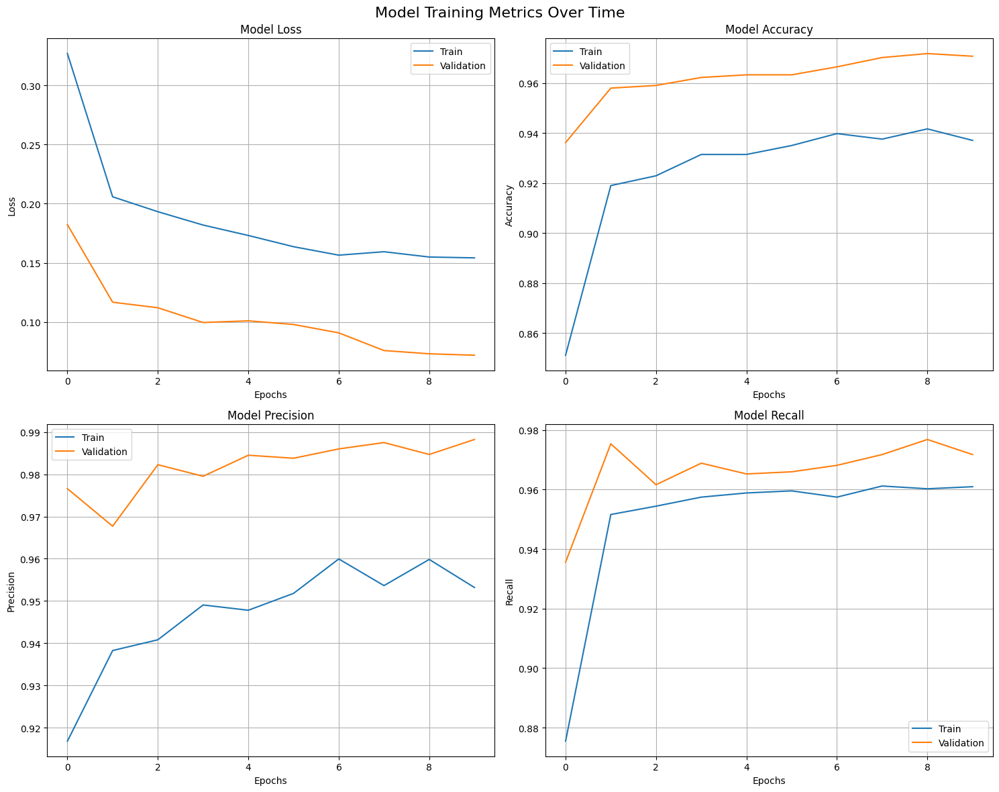


Model saved: resnet18_model.pth
--------------------------------------------------


ResNet18 ROC Predictions: 100%|██████████| 104/104 [00:19<00:00,  5.42it/s]

ResNet18 Results: {'model': ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (

In [ ]:
resnet_results = train_and_evaluate_model(
    model_name='ResNet18',
    model_fn=get_resnet,
    train_loader=train_loader,
    val_loader=val_loader,
    test_loader=test_loader,
    num_epochs=10
)
print("ResNet18 Results:", resnet_results)


**VGG-16**

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)



Training VGG16 model...


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 209MB/s]



Epoch 1/10


184/184 [==============================] - 44.28s 0.24s/step
loss: 0.3059 - accuracy: 0.8685 - precision: 0.8954 - recall: 0.9283
val_loss: 0.1346 - val_accuracy: 0.9527 - val_precision: 0.9530 - val_recall: 0.9841

Epoch 2/10


184/184 [==============================] - 42.32s 0.23s/step
loss: 0.1986 - accuracy: 0.9260 - precision: 0.9483 - recall: 0.9505
val_loss: 0.1141 - val_accuracy: 0.9596 - val_precision: 0.9880 - val_recall: 0.9566

Epoch 3/10


184/184 [==============================] - 42.37s 0.23s/step
loss: 0.1796 - accuracy: 0.9307 - precision: 0.9541 - recall: 0.9509
val_loss: 0.1067 - val_accuracy: 0.9590 - val_precision: 0.9605 - val_recall: 0.9848

Epoch 4/10


184/184 [==============================] - 42.23s 0.23s/step
loss: 0.1683 - accuracy: 0.9340 - precision: 0.9560 - recall: 0.9535
val_loss: 0.0836 - val_accuracy: 0.9702 - val_precision: 0.9897 - val_recall: 0.9696

Epoch 5/10


184/184 [==============================] - 42.03s 0.23s/step
loss: 0.1551 - accuracy: 0.9401 - precision: 0.9589 - recall: 0.9591
val_loss: 0.0735 - val_accuracy: 0.9713 - val_precision: 0.9805 - val_recall: 0.9805

Epoch 6/10


Early stopping patience: 1/5
184/184 [==============================] - 42.25s 0.23s/step
loss: 0.1558 - accuracy: 0.9413 - precision: 0.9639 - recall: 0.9554
val_loss: 0.0759 - val_accuracy: 0.9718 - val_precision: 0.9819 - val_recall: 0.9797

Epoch 7/10


Early stopping patience: 2/5
184/184 [==============================] - 42.19s 0.23s/step
loss: 0.1385 - accuracy: 0.9492 - precision: 0.9663 - recall: 0.9640
val_loss: 0.0758 - val_accuracy: 0.9755 - val_precision: 0.9948 - val_recall: 0.9718

Epoch 8/10


Early stopping patience: 3/5
184/184 [==============================] - 42.26s 0.23s/step
loss: 0.1372 - accuracy: 0.9485 - precision: 0.9665 - recall: 0.9629
val_loss: 0.0828 - val_accuracy: 0.9723 - val_precision: 0.9897 - val_recall: 0.9725

Epoch 9/10


184/184 [==============================] - 42.50s 0.23s/step
loss: 0.1254 - accuracy: 0.9560 - precision: 0.9710 - recall: 0.9687
val_loss: 0.0590 - val_accuracy: 0.9819 - val_precision: 0.9905 - val_recall: 0.9848

Epoch 10/10


Early stopping patience: 1/5
184/184 [==============================] - 42.41s 0.23s/step
loss: 0.1605 - accuracy: 0.9374 - precision: 0.9579 - recall: 0.9563
val_loss: 0.0899 - val_accuracy: 0.9691 - val_precision: 0.9933 - val_recall: 0.9645


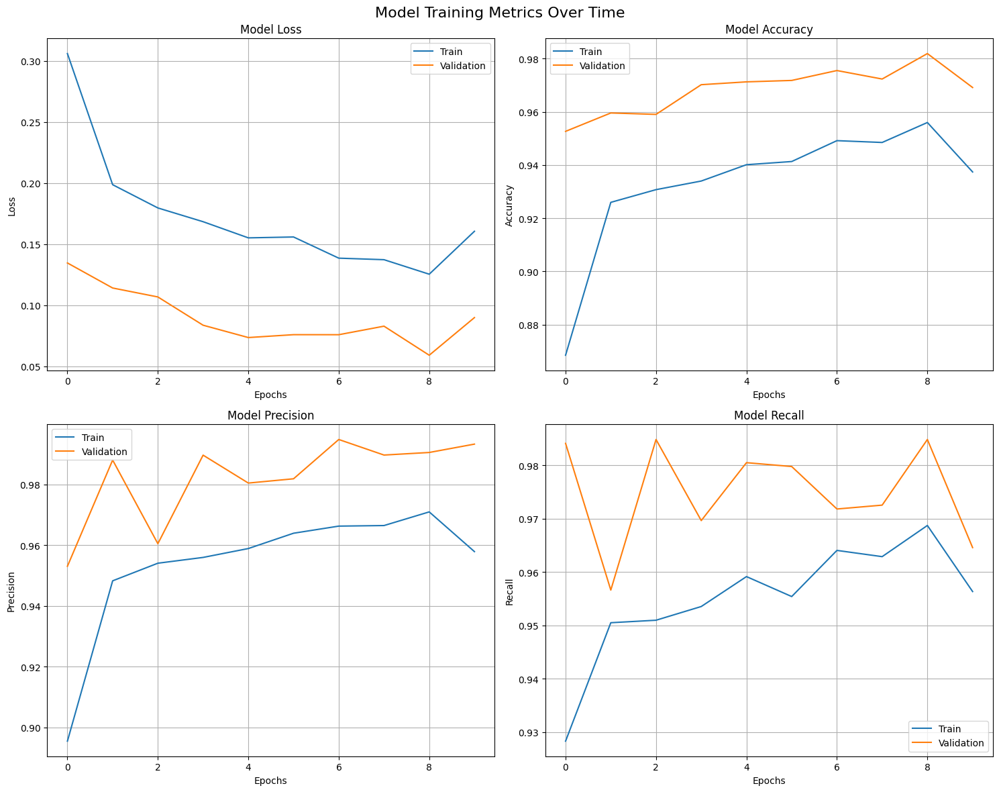


Model saved: vgg16_model.pth
--------------------------------------------------


VGG16 ROC Predictions: 100%|██████████| 104/104 [00:20<00:00,  5.04it/s]

VGG16 Results: {'model': VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride

In [ ]:
vgg16_results = train_and_evaluate_model(
    model_name='VGG16',
    model_fn=get_vgg16,
    train_loader=train_loader,
    val_loader=val_loader,
    test_loader=test_loader,
    num_epochs=10
)
print("VGG16 Results:", vgg16_results)


**EfficientNet**

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth



Training EfficientNet model...


100%|██████████| 20.5M/20.5M [00:00<00:00, 218MB/s]



Epoch 1/10


184/184 [==============================] - 41.92s 0.23s/step
loss: 0.4592 - accuracy: 0.8079 - precision: 0.8534 - recall: 0.8897
val_loss: 0.3675 - val_accuracy: 0.8293 - val_precision: 0.9836 - val_recall: 0.7808

Epoch 2/10


184/184 [==============================] - 41.25s 0.22s/step
loss: 0.2952 - accuracy: 0.8808 - precision: 0.9089 - recall: 0.9299
val_loss: 0.2350 - val_accuracy: 0.9021 - val_precision: 0.9807 - val_recall: 0.8842

Epoch 3/10


184/184 [==============================] - 41.94s 0.23s/step
loss: 0.2539 - accuracy: 0.8992 - precision: 0.9224 - recall: 0.9411
val_loss: 0.2031 - val_accuracy: 0.9186 - val_precision: 0.9842 - val_recall: 0.9038

Epoch 4/10


184/184 [==============================] - 41.94s 0.23s/step
loss: 0.2340 - accuracy: 0.9074 - precision: 0.9285 - recall: 0.9460
val_loss: 0.1956 - val_accuracy: 0.9186 - val_precision: 0.9850 - val_recall: 0.9030

Epoch 5/10


184/184 [==============================] - 41.76s 0.23s/step
loss: 0.2262 - accuracy: 0.9104 - precision: 0.9392 - recall: 0.9381
val_loss: 0.1594 - val_accuracy: 0.9394 - val_precision: 0.9825 - val_recall: 0.9342

Epoch 6/10


184/184 [==============================] - 41.64s 0.23s/step
loss: 0.2205 - accuracy: 0.9113 - precision: 0.9330 - recall: 0.9465
val_loss: 0.1588 - val_accuracy: 0.9362 - val_precision: 0.9832 - val_recall: 0.9291

Epoch 7/10


184/184 [==============================] - 41.51s 0.23s/step
loss: 0.2165 - accuracy: 0.9135 - precision: 0.9384 - recall: 0.9435
val_loss: 0.1515 - val_accuracy: 0.9410 - val_precision: 0.9847 - val_recall: 0.9342

Epoch 8/10


Early stopping patience: 1/5
184/184 [==============================] - 41.59s 0.23s/step
loss: 0.2114 - accuracy: 0.9168 - precision: 0.9381 - recall: 0.9486
val_loss: 0.1677 - val_accuracy: 0.9356 - val_precision: 0.9914 - val_recall: 0.9204

Epoch 9/10


Early stopping patience: 2/5
184/184 [==============================] - 41.69s 0.23s/step
loss: 0.2011 - accuracy: 0.9210 - precision: 0.9475 - recall: 0.9442
val_loss: 0.1585 - val_accuracy: 0.9394 - val_precision: 0.9884 - val_recall: 0.9284

Epoch 10/10


Early stopping patience: 3/5
184/184 [==============================] - 41.60s 0.23s/step
loss: 0.1976 - accuracy: 0.9222 - precision: 0.9432 - recall: 0.9507
val_loss: 0.1582 - val_accuracy: 0.9372 - val_precision: 0.9892 - val_recall: 0.9247


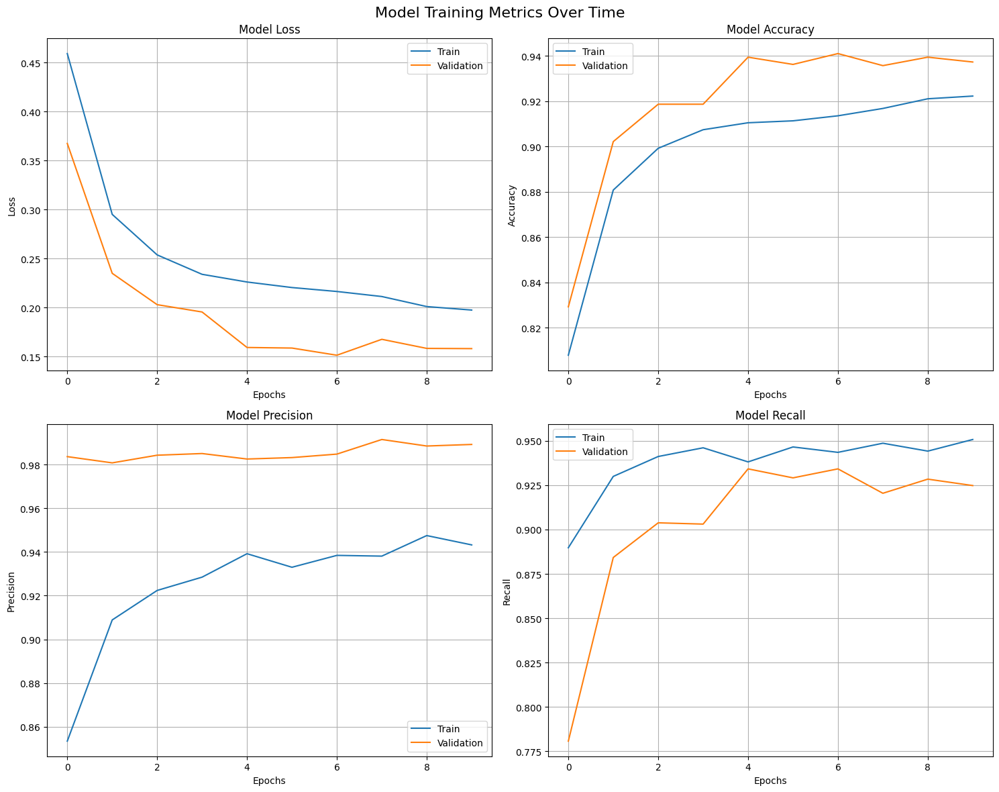


Model saved: efficientnet_model.pth
--------------------------------------------------


EfficientNet ROC Predictions: 100%|██████████| 104/104 [00:18<00:00,  5.50it/s]

EfficientNet Results: {'model': EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )


In [ ]:
efficientnet_results = train_and_evaluate_model(
    model_name='EfficientNet',
    model_fn=get_efficientnet,
    train_loader=train_loader,
    val_loader=val_loader,
    test_loader=test_loader,
    num_epochs=10
)
print("EfficientNet Results:", efficientnet_results)


**Custom CNN**


Training CustomCNN model...

Epoch 1/10


184/184 [==============================] - 41.50s 0.23s/step
loss: 0.5402 - accuracy: 0.7424 - precision: 0.7621 - recall: 0.9409
val_loss: 0.4186 - val_accuracy: 0.8622 - val_precision: 0.8634 - val_recall: 0.9653

Epoch 2/10


184/184 [==============================] - 41.10s 0.22s/step
loss: 0.4789 - accuracy: 0.7873 - precision: 0.7998 - recall: 0.9453
val_loss: 0.3512 - val_accuracy: 0.9000 - val_precision: 0.9462 - val_recall: 0.9161

Epoch 3/10


Early stopping patience: 1/5
184/184 [==============================] - 41.53s 0.23s/step
loss: 0.4470 - accuracy: 0.7956 - precision: 0.8146 - recall: 0.9322
val_loss: 0.4955 - val_accuracy: 0.7920 - val_precision: 0.9778 - val_recall: 0.7337

Epoch 4/10


Early stopping patience: 2/5
184/184 [==============================] - 41.38s 0.22s/step
loss: 0.4417 - accuracy: 0.8013 - precision: 0.8194 - recall: 0.9336
val_loss: 0.3861 - val_accuracy: 0.8851 - val_precision: 0.9686 - val_recall: 0.8719

Epoch 5/10


184/184 [==============================] - 41.57s 0.23s/step
loss: 0.4196 - accuracy: 0.8106 - precision: 0.8301 - recall: 0.9313
val_loss: 0.3287 - val_accuracy: 0.9080 - val_precision: 0.9590 - val_recall: 0.9139

Epoch 6/10


Early stopping patience: 1/5
184/184 [==============================] - 41.10s 0.22s/step
loss: 0.4168 - accuracy: 0.8146 - precision: 0.8366 - recall: 0.9271
val_loss: 0.3467 - val_accuracy: 0.8596 - val_precision: 0.9761 - val_recall: 0.8292

Epoch 7/10


184/184 [==============================] - 41.72s 0.23s/step
loss: 0.4157 - accuracy: 0.8170 - precision: 0.8388 - recall: 0.9276
val_loss: 0.3239 - val_accuracy: 0.9000 - val_precision: 0.9621 - val_recall: 0.8994

Epoch 8/10


184/184 [==============================] - 41.48s 0.23s/step
loss: 0.4031 - accuracy: 0.8212 - precision: 0.8444 - recall: 0.9257
val_loss: 0.2824 - val_accuracy: 0.9133 - val_precision: 0.9492 - val_recall: 0.9320

Epoch 9/10


184/184 [==============================] - 41.67s 0.23s/step
loss: 0.3855 - accuracy: 0.8320 - precision: 0.8517 - recall: 0.9322
val_loss: 0.2754 - val_accuracy: 0.9112 - val_precision: 0.9293 - val_recall: 0.9515

Epoch 10/10


Early stopping patience: 1/5
184/184 [==============================] - 41.43s 0.23s/step
loss: 0.4026 - accuracy: 0.8202 - precision: 0.8454 - recall: 0.9224
val_loss: 0.2764 - val_accuracy: 0.9128 - val_precision: 0.9498 - val_recall: 0.9305


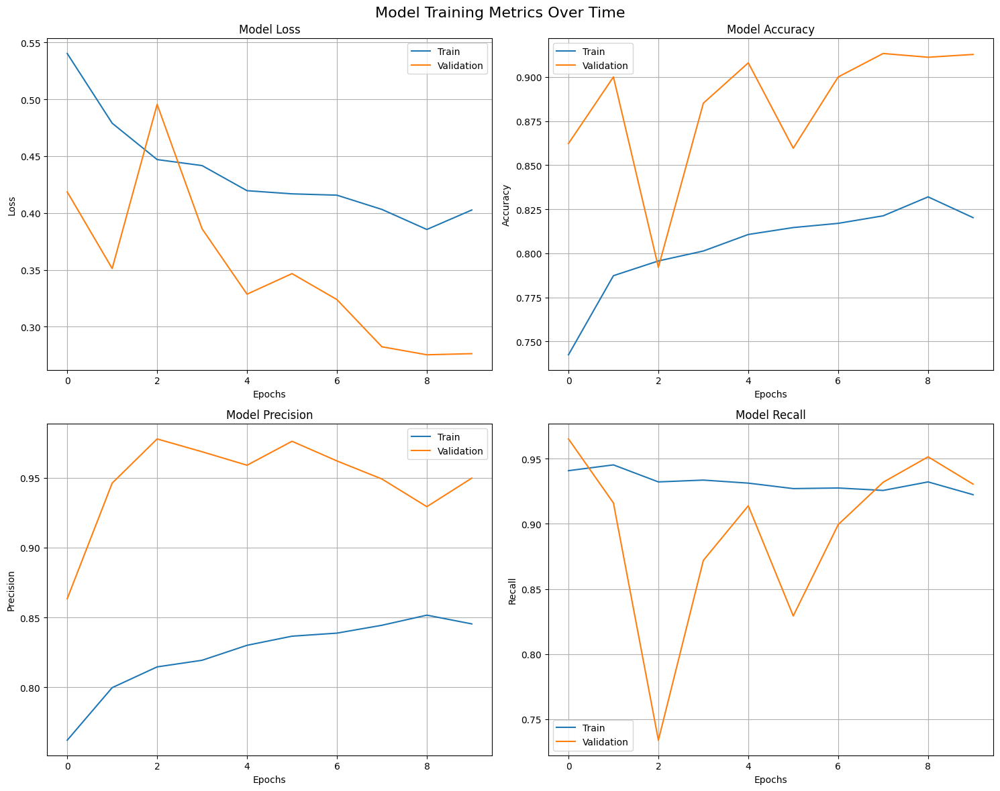


Model saved: customcnn_model.pth
--------------------------------------------------


CustomCNN ROC Predictions: 100%|██████████| 104/104 [00:18<00:00,  5.51it/s]

CustomCNN Results: {'model': Sequential(
  (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU()
  (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (4): ReLU()
  (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (6): Flatten(start_dim=1, end_dim=-1)
  (7): Linear(in_features=200704, out_features=128, bias=True)
  (8): ReLU()
  (9): Dropout(p=0.5, inplace=False)
  (10): Linear(in_features=128, out_features=2, bias=True)
), 'history': defaultdict(<class 'list'>, {'train_loss': [0.5401967320105304, 0.478919241739356, 0.4469701692299998, 0.441683965532676, 0.4196131372743327, 0.41684962987251906, 0.4156667819327634, 0.4031483489696098, 0.3855313806916061, 0.40264222147348133], 'val_loss': [0.4185653119269064, 0.35121852866673875, 0.49546514072660675, 0.3860952051009162, 0.32865052960686764, 0.34672672011084477, 0.32388818819

In [ ]:
customcnn_results = train_and_evaluate_model(
    model_name='CustomCNN',
    model_fn=get_custom_cnn,
    train_loader=train_loader,
    val_loader=val_loader,
    test_loader=test_loader,
    num_epochs=10
)
print("CustomCNN Results:", customcnn_results)

### **3. Visualization Model Performance Evaluation & Comparisons**



---



This section focuses on visualizing and evaluating the performance of trained models using Grad-CAM, confusion matrices, and prediction samples. The goal is to interpret the model's predictions and understand its decision-making process.

1. **Confusion Matrix**:
   - A confusion matrix is plotted to analyze the model's classification performance across different classes.
   - Provides detailed insights into true positives, true negatives, false positives, and false negatives.

2. **Performance Metrics**:
   - Accuracy, precision, recall, and F1-score are calculated for the model's predictions.
   - These metrics are crucial for evaluating model performance in a balanced and comprehensive manner.





Test Results for All Models:
Model             Accuracy  Precision     Recall   F1-Score
----------------------------------------------------------------------
ResNet18            0.9680     0.9857     0.9702     0.9779
VGG16               0.9623     0.9889     0.9590     0.9737
EfficientNet        0.9248     0.9809     0.9146     0.9466
CustomCNN           0.9019     0.9416     0.9225     0.9320

Generating comparative visualizations...

ResNet18 Confusion Matrix


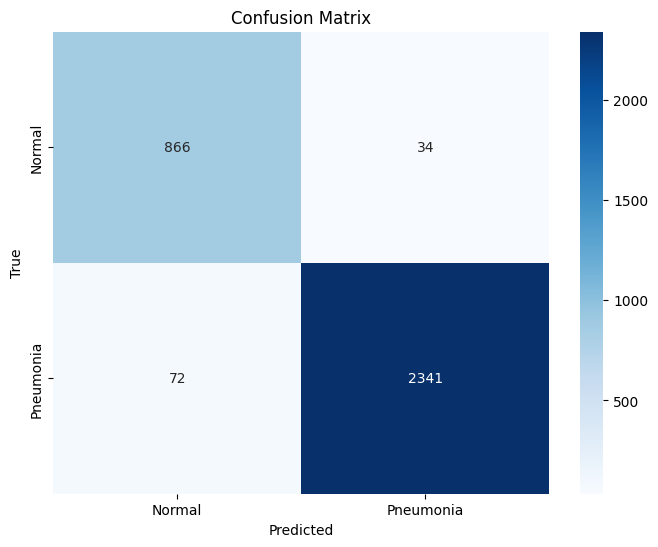


VGG16 Confusion Matrix


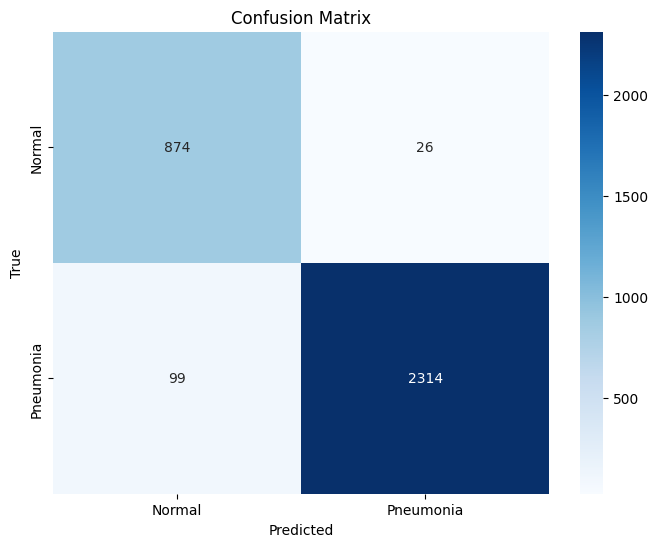


EfficientNet Confusion Matrix


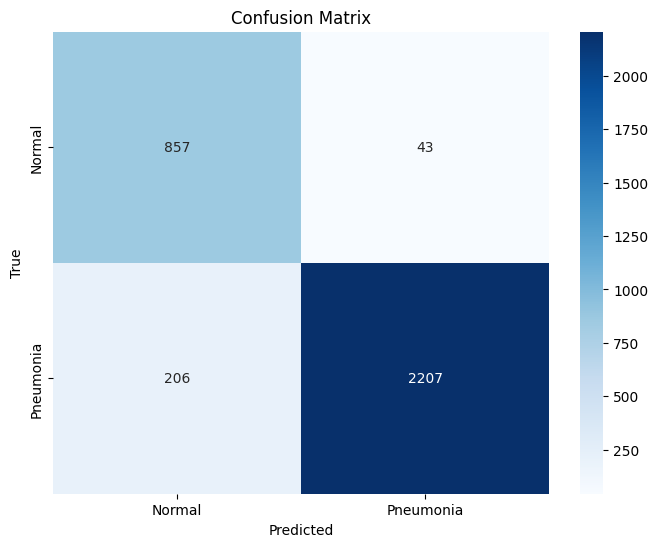


CustomCNN Confusion Matrix


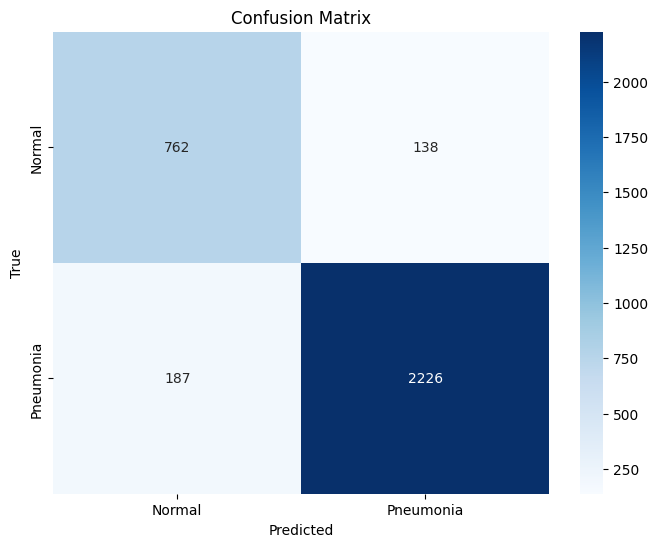

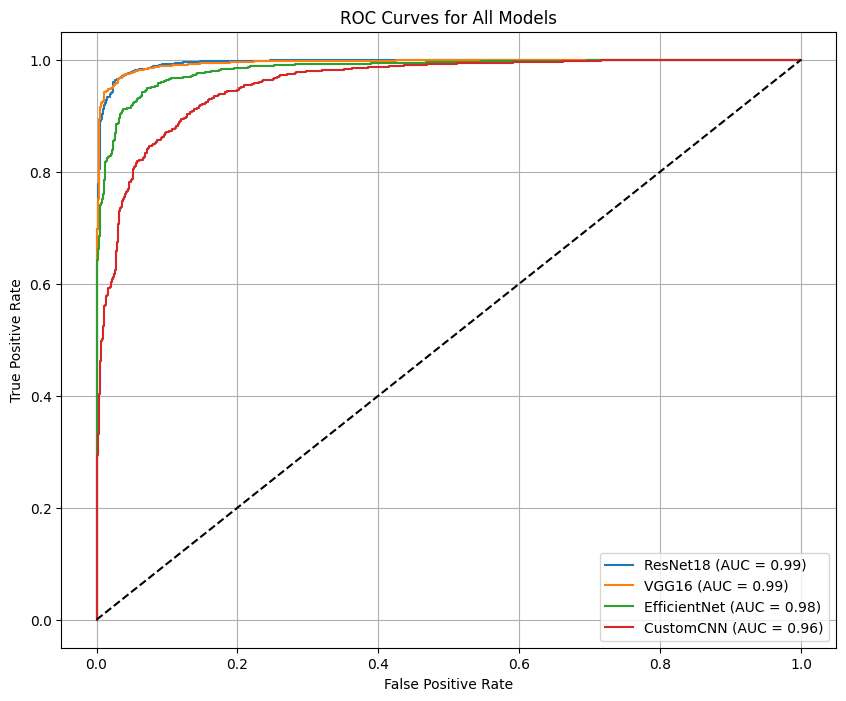


Training and evaluation of all models completed!


In [ ]:
all_results = {
    'ResNet18': resnet_results,
    'VGG16': vgg16_results,
    'EfficientNet': efficientnet_results,
    'CustomCNN': customcnn_results
}

# Comparative evaluation of all models
print("\nTest Results for All Models:")
print("=" * 70)
print(f"{'Model':<15} {'Accuracy':>10} {'Precision':>10} {'Recall':>10} {'F1-Score':>10}")
print("-" * 70)

metrics_dict = {}
for model_name, results in all_results.items():
    metrics = results['metrics']
    metrics_dict[model_name] = {
        'accuracy': metrics['accuracy'],
        'precision': metrics['precision'],
        'recall': metrics['recall'],
        'f1': metrics['f1']
    }
    print(f"{model_name:<15} {metrics['accuracy']:>10.4f} {metrics['precision']:>10.4f} "
          f"{metrics['recall']:>10.4f} {metrics['f1']:>10.4f}")

print("=" * 70)

# Comparative visualizations
print("\nGenerating comparative visualizations...")

# Confusion matrix for each model
for model_name, results in all_results.items():
    print(f"\n{model_name} Confusion Matrix")
    plot_confusion_matrix(
        results['metrics']['targets'],
        results['metrics']['predictions'],
        classes=["Normal", "Pneumonia"]
    )

# ROC curves for all models
plt.figure(figsize=(10, 8))
for model_name, results in all_results.items():
    fpr, tpr, _ = roc_curve(results['metrics']['targets'], results['probs'])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All Models')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()



print("\nTraining and evaluation of all models completed!")


### **4. Visualization for Correct and Incorrect Classifications**:
   - Many various tecniques are applied separately to correct and incorrect classifications to visualize the model's focus areas:
     - **Correct Predictions**: Examine whether the model identifies clinically relevant regions.
     - **Incorrect Predictions**: Investigate possible reasons for misclassifications (e.g., lack of focus on key areas).

#### **- Grad-CAM (Gradient-weighted Class Activation Mapping)**:
   - Grad-CAM generates heatmaps highlighting the regions of an image that the model focuses on while making predictions.
   - Helps in validating whether the model's focus aligns with clinically relevant areas (e.g., regions with visible pneumonia symptoms).

In [ ]:
!pip install git+https://github.com/jacobgil/pytorch-grad-cam.git


  Cloning https://github.com/jacobgil/pytorch-grad-cam.git to /tmp/pip-req-build-k9yhbi6f
  Running command git clone --filter=blob:none --quiet https://github.com/jacobgil/pytorch-grad-cam.git /tmp/pip-req-build-k9yhbi6f
  Resolved https://github.com/jacobgil/pytorch-grad-cam.git to commit a2a23f83916d1caa428c447890d7ed5870818341
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
import random
from torchvision.transforms.functional import normalize
from torchvision.transforms import ToTensor
from torchvision.utils import make_grid
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# Apply Grad-CAM visualization to a set of images
def apply_grad_cam(model, images, labels, preds, target_layer, title):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model.eval()

    images = images.to(device)
    preds = preds.to(device)
    labels = labels.to(device)

    cam = GradCAM(model=model, target_layers=[target_layer])

    fig, axes = plt.subplots(len(images), 2, figsize=(12, len(images) * 5))
    for i, img in enumerate(images):

        rgb_img = img.permute(1, 2, 0).cpu().numpy()
        # ImageNet normalizasyonunu geri al
        rgb_img = rgb_img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        rgb_img = np.clip(rgb_img, 0, 1)


        #rgb_img = img.permute(1, 2, 0).cpu().numpy()
        #rgb_img = (rgb_img - np.min(rgb_img)) / (np.max(rgb_img) - np.min(rgb_img))  # Normalize image

        targets = [ClassifierOutputTarget(int(preds[i]))]
        grayscale_cam = cam(input_tensor=img.unsqueeze(0), targets=targets)[0]  # Generate Grad-

        grayscale_cam = np.power(grayscale_cam, 1.3)  # Daha yumuşak bir contrast ayarı


        cam_image = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)  # Overlay CAM on image

        axes[i, 0].imshow(rgb_img)
        axes[i, 0].set_title(f"Original Image\nTrue: {labels[i].item()} | Pred: {preds[i].item()}")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(cam_image)
        axes[i, 1].set_title("Grad-CAM")
        axes[i, 1].axis("off")

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

#### **- Model Prediction Visualization**:
   - Displays a grid of sample images along with their ground truth labels and model predictions.
   - Highlights both correct and incorrect predictions to assess model behavior.

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
 


Performing Grad-CAM analysis for ResNet


<ipython-input-77-43b65a228713>:63: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(weights_path))  # Load model weights


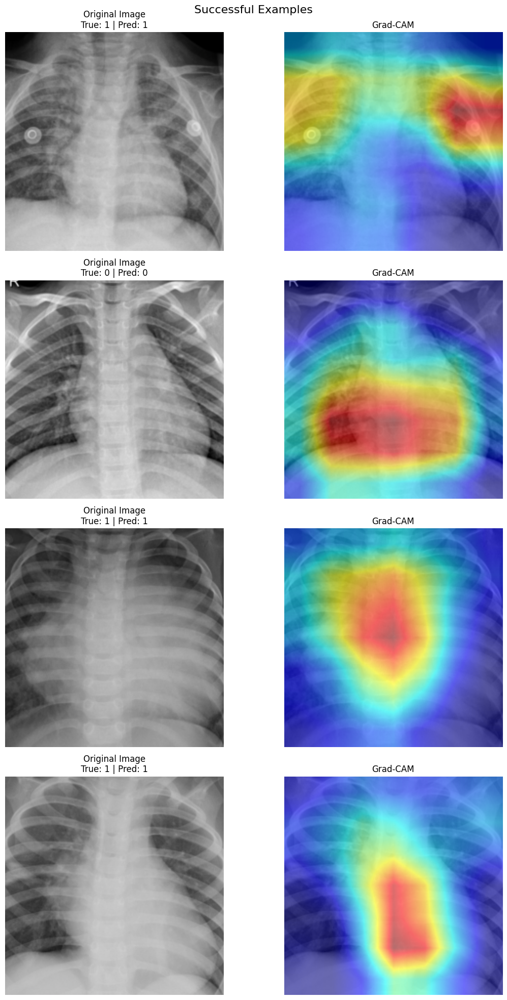

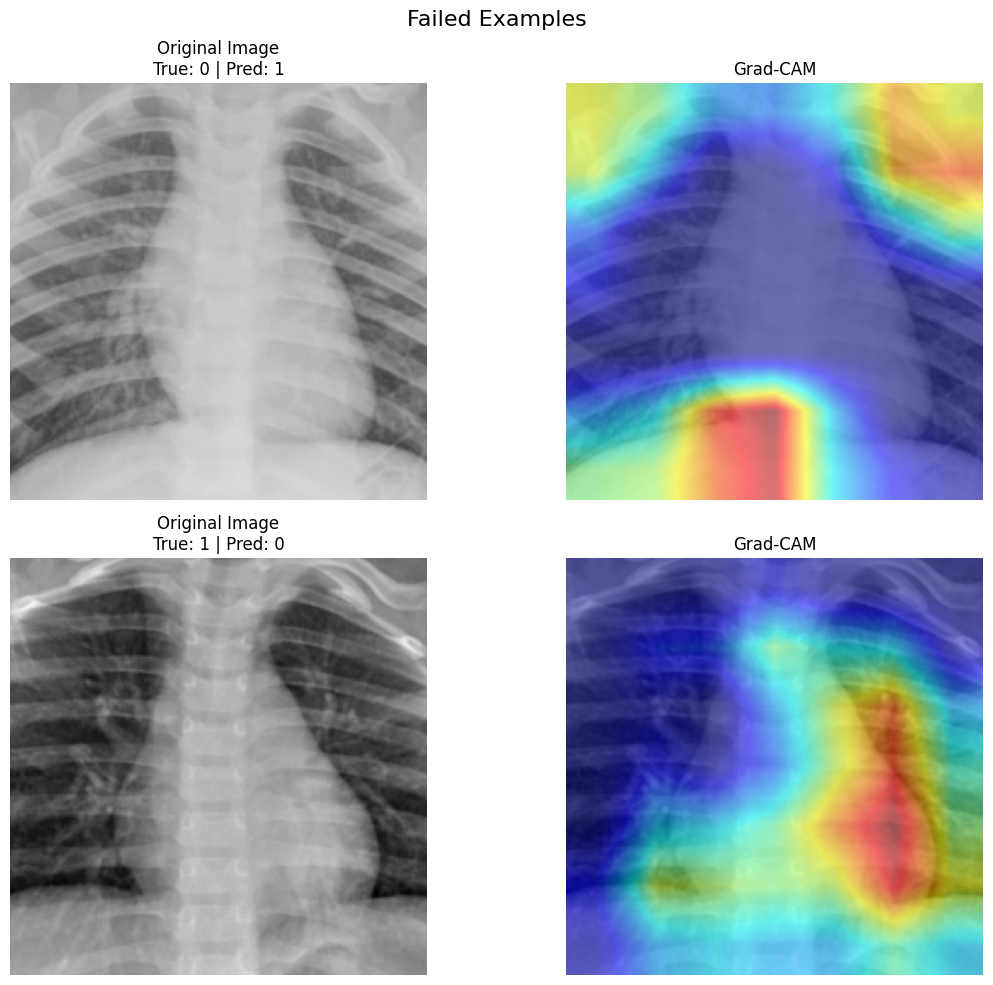


Performing Grad-CAM analysis for VGG16


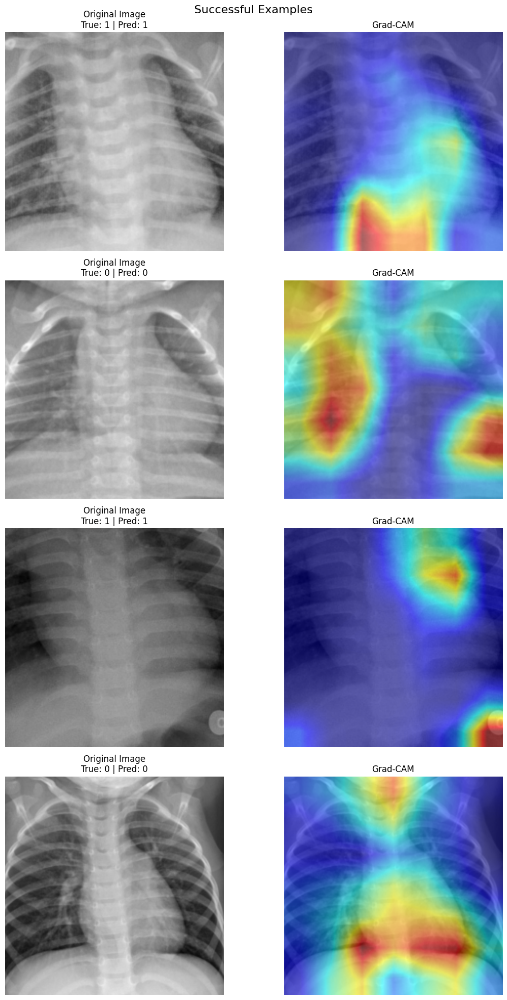

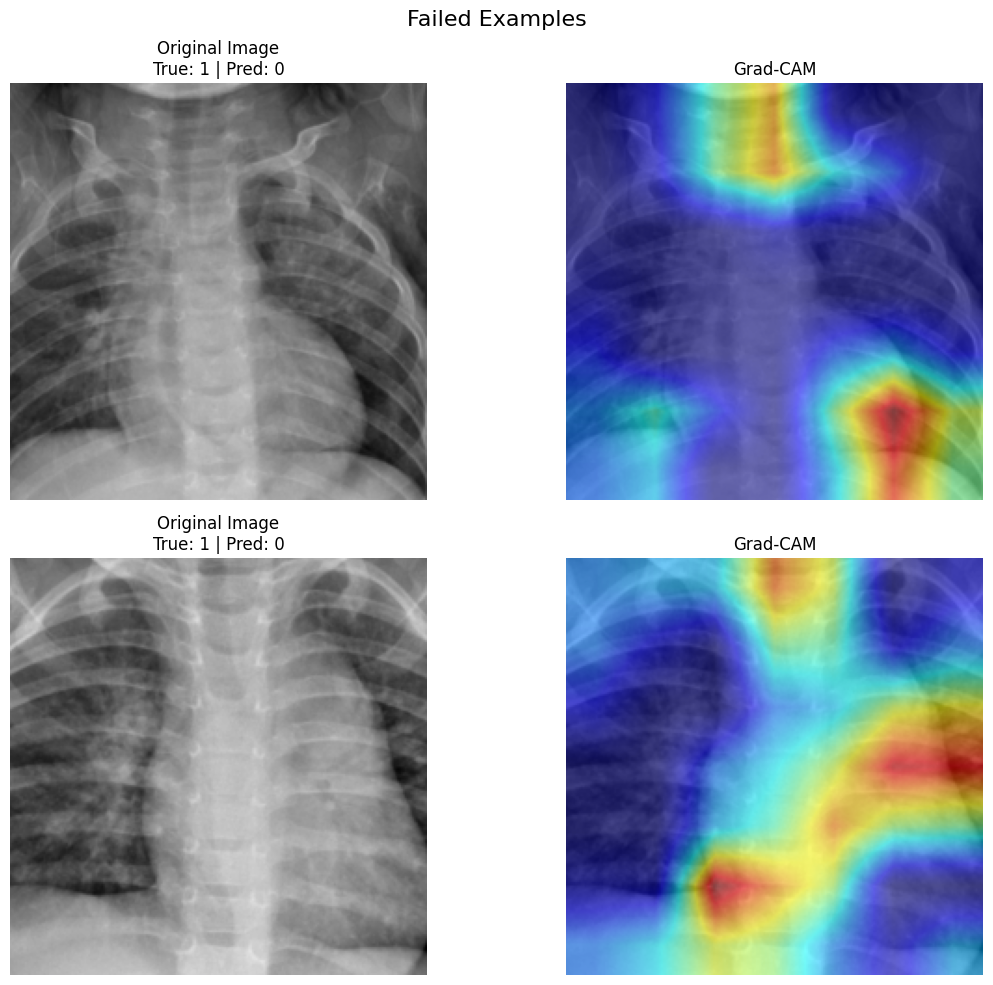


Performing Grad-CAM analysis for EfficientNet


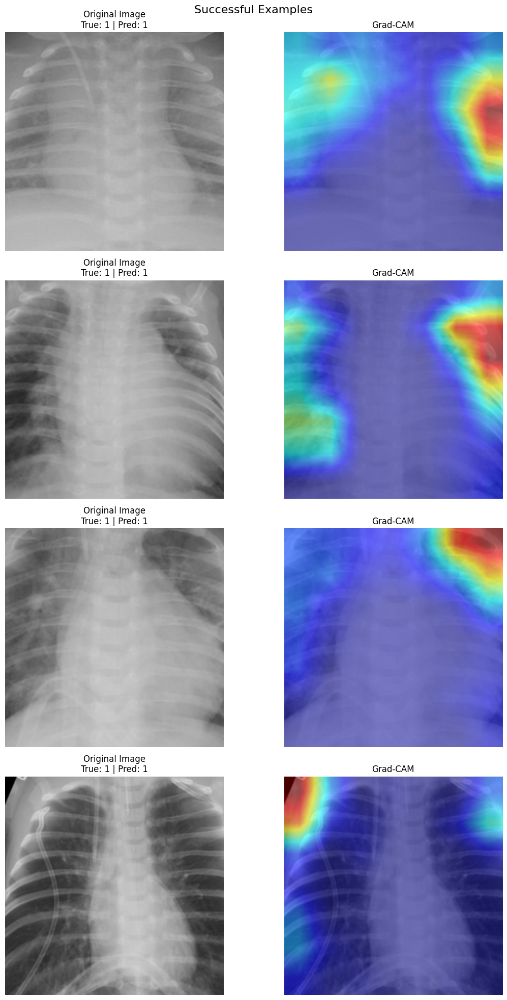

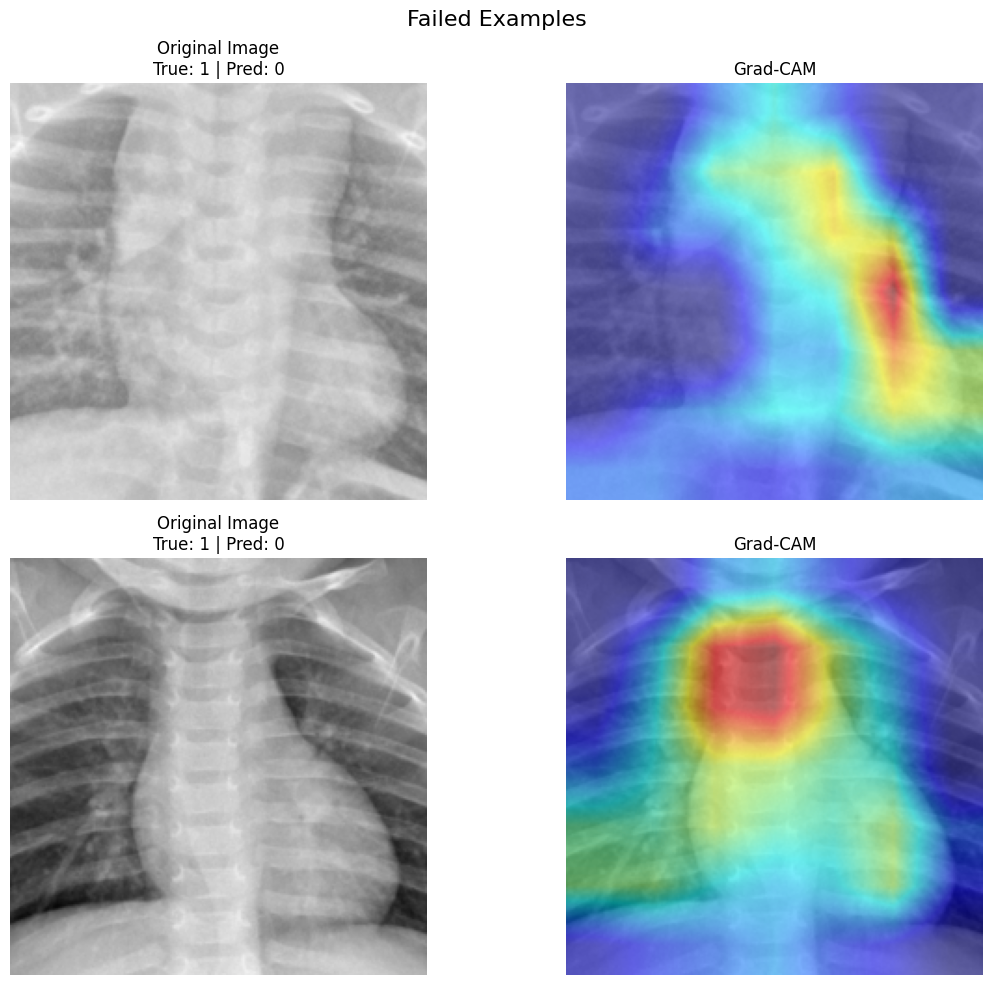


Performing Grad-CAM analysis for CustomCNN


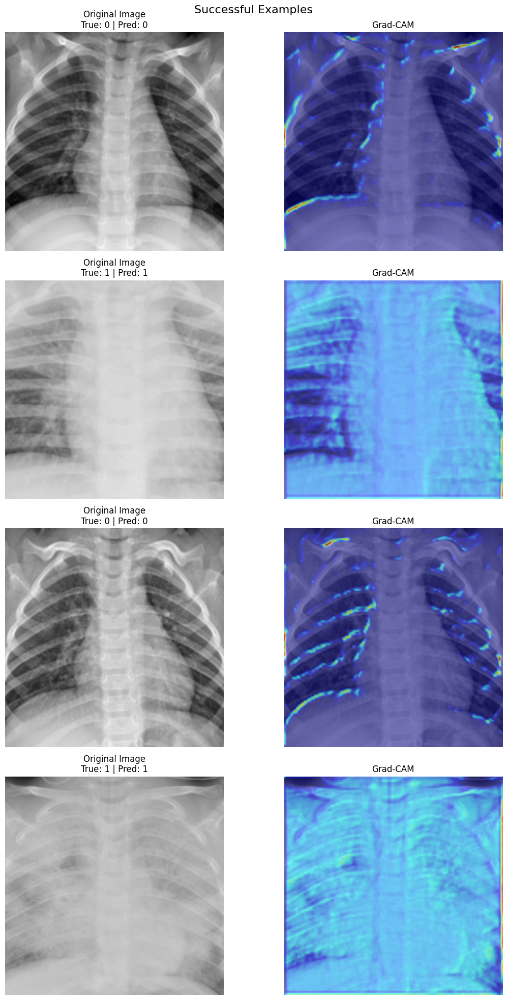

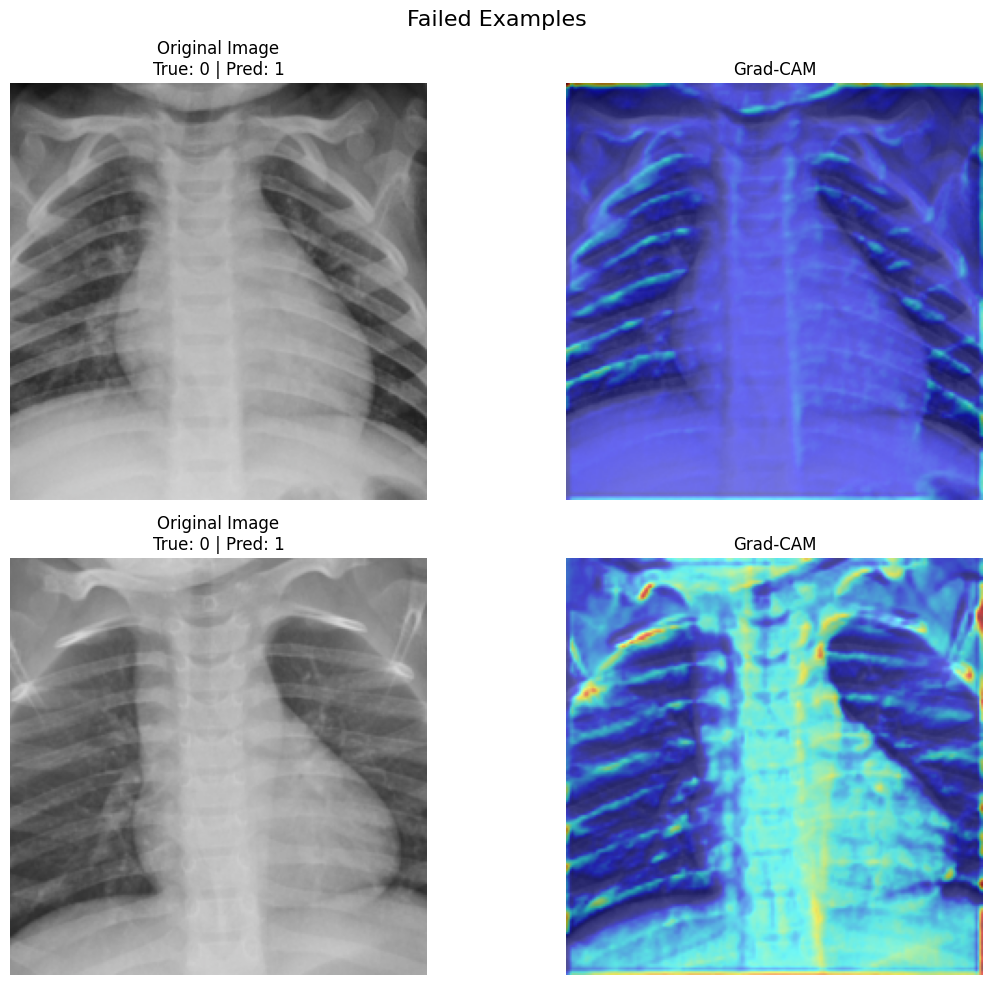

In [ ]:
# Grad-CAM analysis function with successful and failed example selection
def visualize_model_predictions(model, dataloader, class_names, target_layer):
    model.eval()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    all_preds = []
    all_labels = []
    all_images = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_images.extend(inputs.cpu())

    all_images = torch.stack(all_images)
    all_labels = torch.tensor(all_labels)
    all_preds = torch.tensor(all_preds)

    # Indices for correct and incorrect predictions
    correct_idx = (all_preds == all_labels).nonzero(as_tuple=True)[0]
    incorrect_idx = (all_preds != all_labels).nonzero(as_tuple=True)[0]

    # Select 4 successful and 2 failed examples
    successful_samples = correct_idx[torch.randperm(len(correct_idx))[:4]]  # 4 correct samples
    failed_samples = incorrect_idx[torch.randperm(len(incorrect_idx))[:2]]  # 2 incorrect samples

    # Apply Grad-CAM for successful examples
    if len(successful_samples) > 0:
        apply_grad_cam(
            model,
            all_images[successful_samples],
            all_labels[successful_samples],
            all_preds[successful_samples],
            target_layer,
            "Successful Examples"
        )

    # Apply Grad-CAM for failed examples
    if len(failed_samples) > 0:
        apply_grad_cam(
            model,
            all_images[failed_samples],
            all_labels[failed_samples],
            all_preds[failed_samples],
            target_layer,
            "Failed Examples"
        )

# Test all models and perform Grad-CAM analysis
model_configs = {
    'ResNet': (get_resnet(), 'resnet18_model.pth', lambda m: m.layer4),
    'VGG16': (get_vgg16(), 'vgg16_model.pth', lambda m: m.features[-1]),
    'EfficientNet': (get_efficientnet(), 'efficientnet_model.pth', lambda m: m.features[-1]),
    'CustomCNN': (get_custom_cnn(), 'customcnn_model.pth', lambda m: m[3])
}

for name, (model, weights_path, get_target_layer) in model_configs.items():
    print(f"\nPerforming Grad-CAM analysis for {name}")
    model.load_state_dict(torch.load(weights_path))  # Load model weights
    model.to(torch.device("cuda" if torch.cuda.is_available() else "cpu"))
    visualize_model_predictions(model, test_loader, ["Normal", "Pneumonia"], get_target_layer(model))


<ipython-input-78-ea7513ed8b67>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('resnet18_model.pth'))


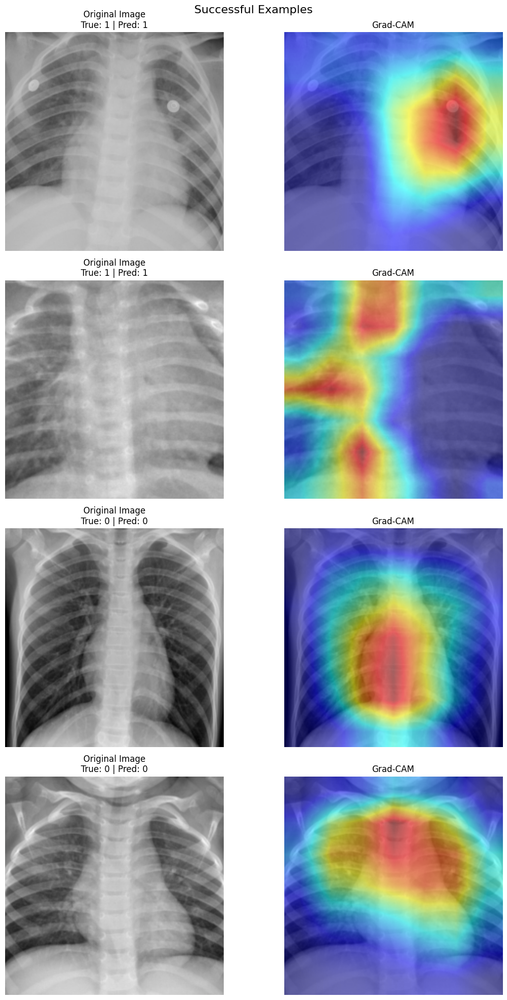

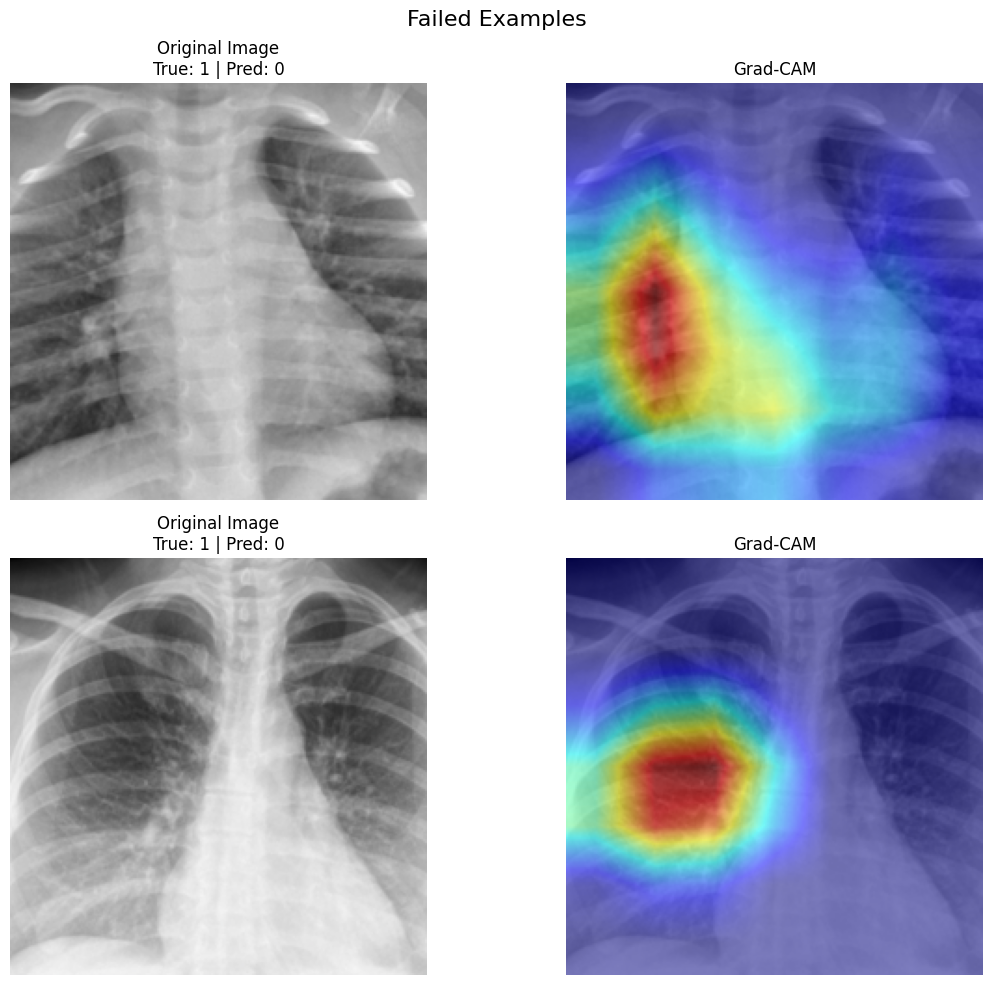

In [ ]:
# Test için:
model = get_resnet()
model.load_state_dict(torch.load('resnet18_model.pth'))
model.to(device)
visualize_model_predictions(model, test_loader, ["Normal", "Pneumonia"], model.layer4)

## **STEP 5 : Testing Models on Real-World Data**


To assess model generalization, this section evaluates trained models on a real-world dataset. The steps include:


---


1. **Loading Real-World Data**:
   - Images are preprocessed using the same transformations as the training dataset.

2. **Evaluation**:
   - Models are tested on real-world data, and their predictions are visualized.
   - Metrics like accuracy and confusion matrices are computed.

3. **Grad-CAM Analysis**:
   - Heatmaps are generated to visualize the model's focus areas, ensuring it attends to clinically relevant features.


---


This step is crucial for determining the robustness of the models in practical applications.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Testing models on Real World Data:

Evaluating ResNet...
Total samples processed: 144


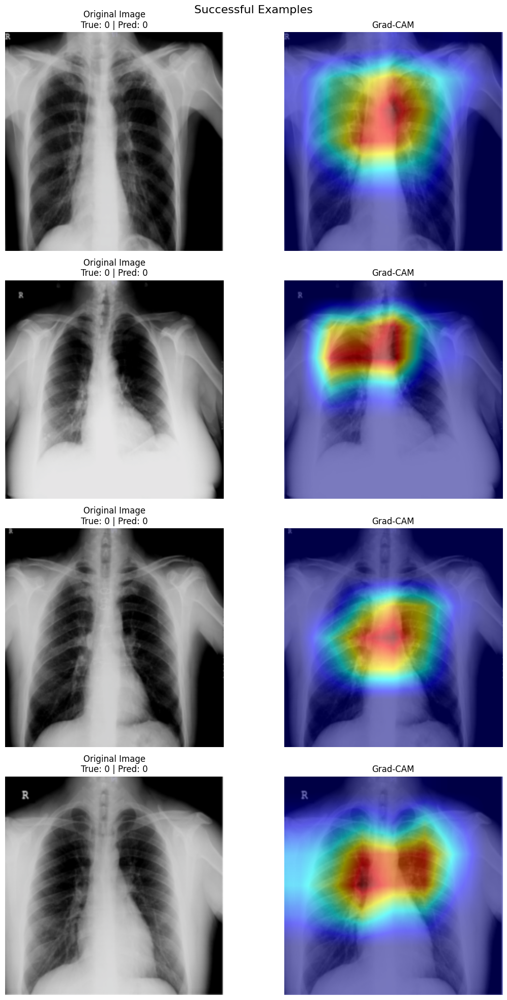

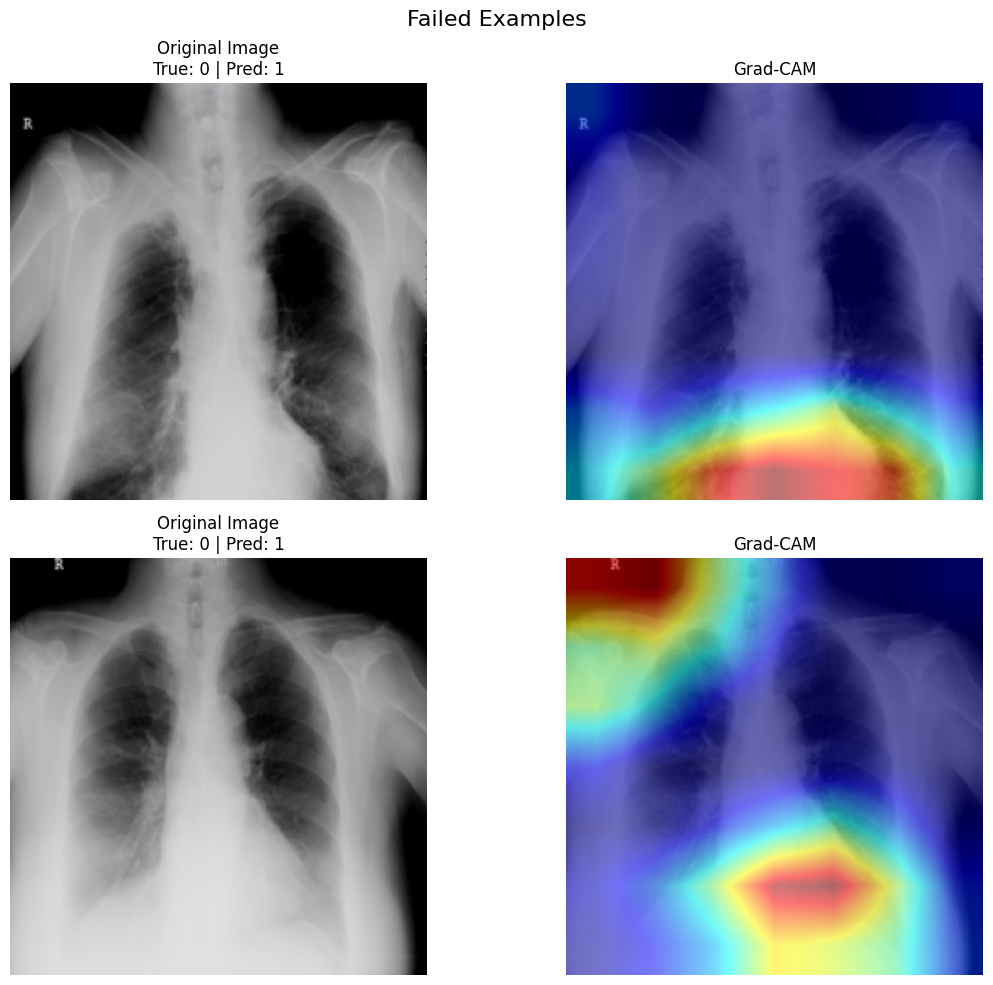


Evaluating VGG16...
Total samples processed: 144


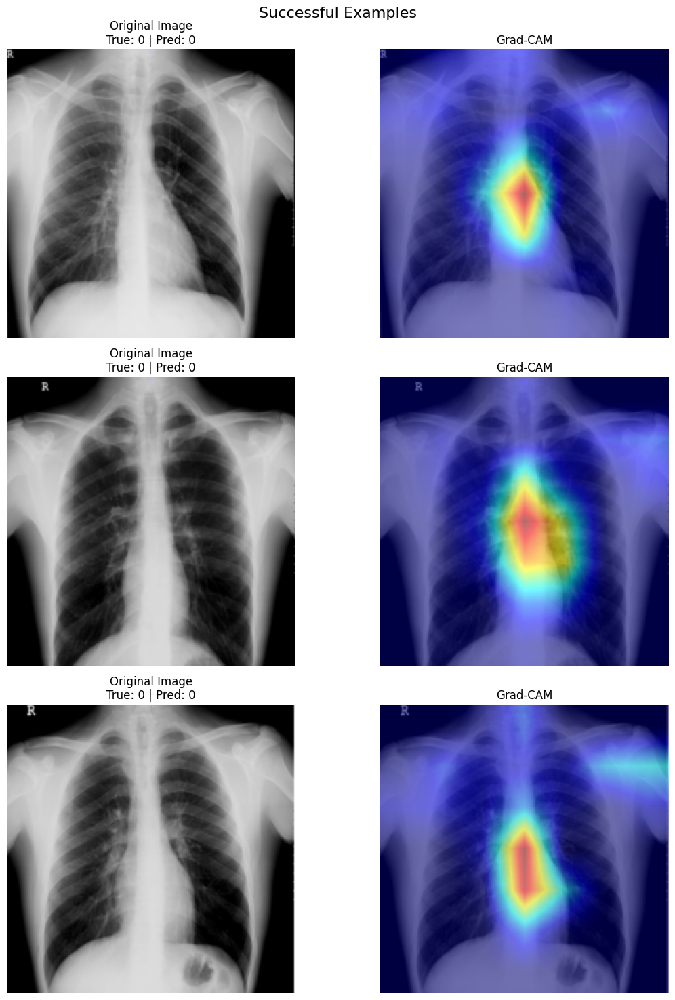

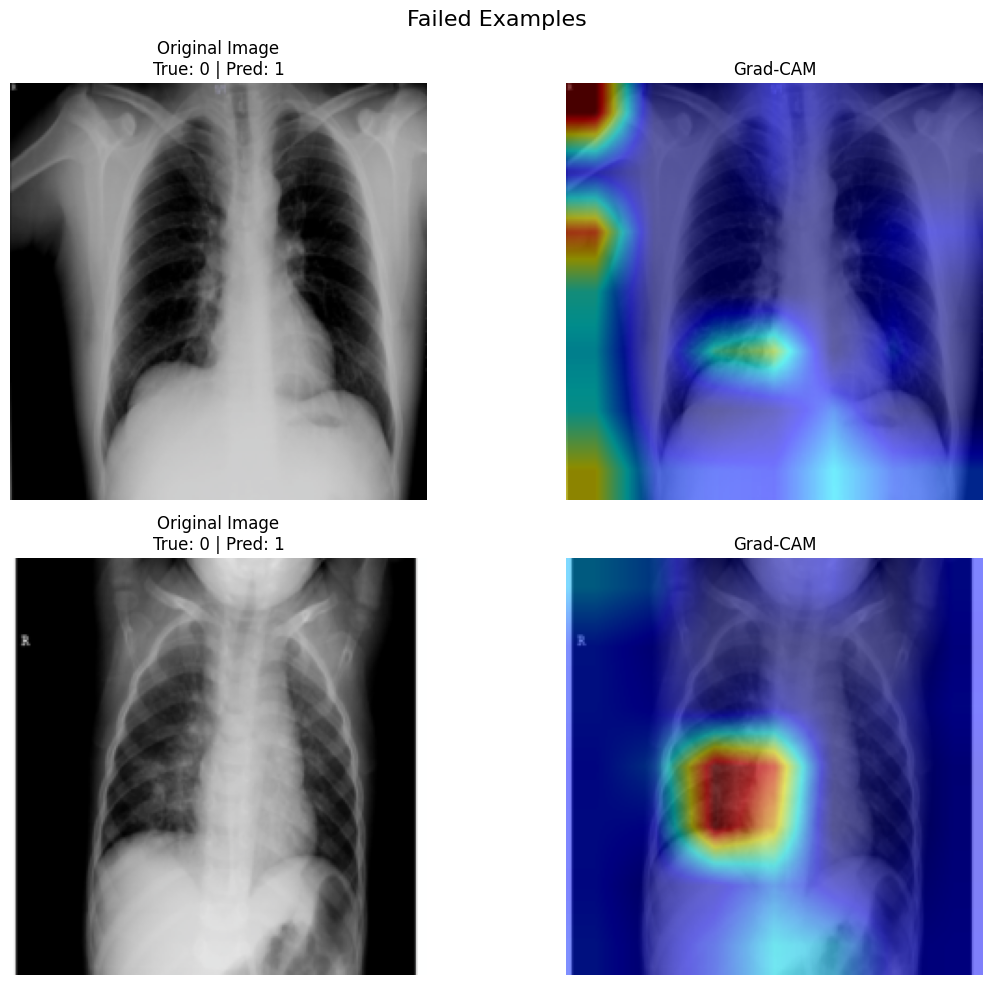


Evaluating EfficientNet...
Total samples processed: 144


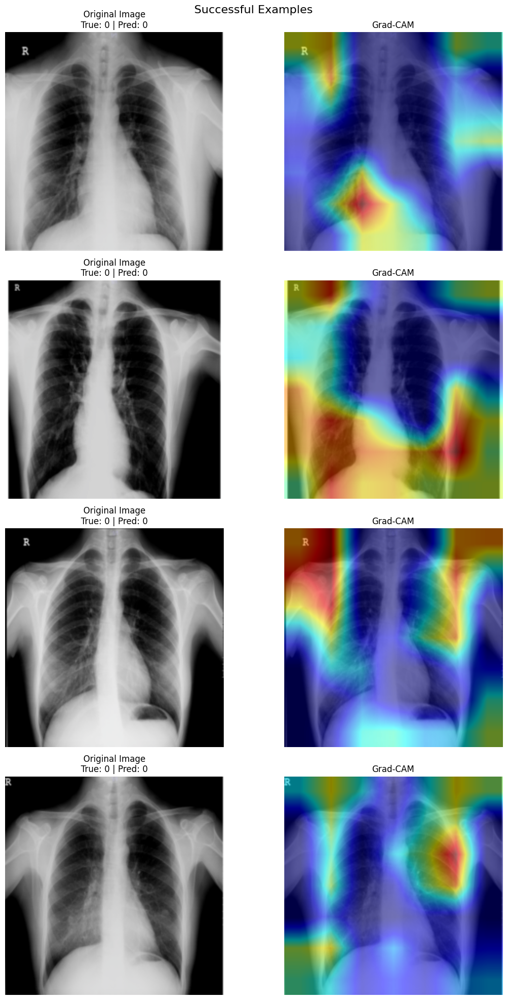

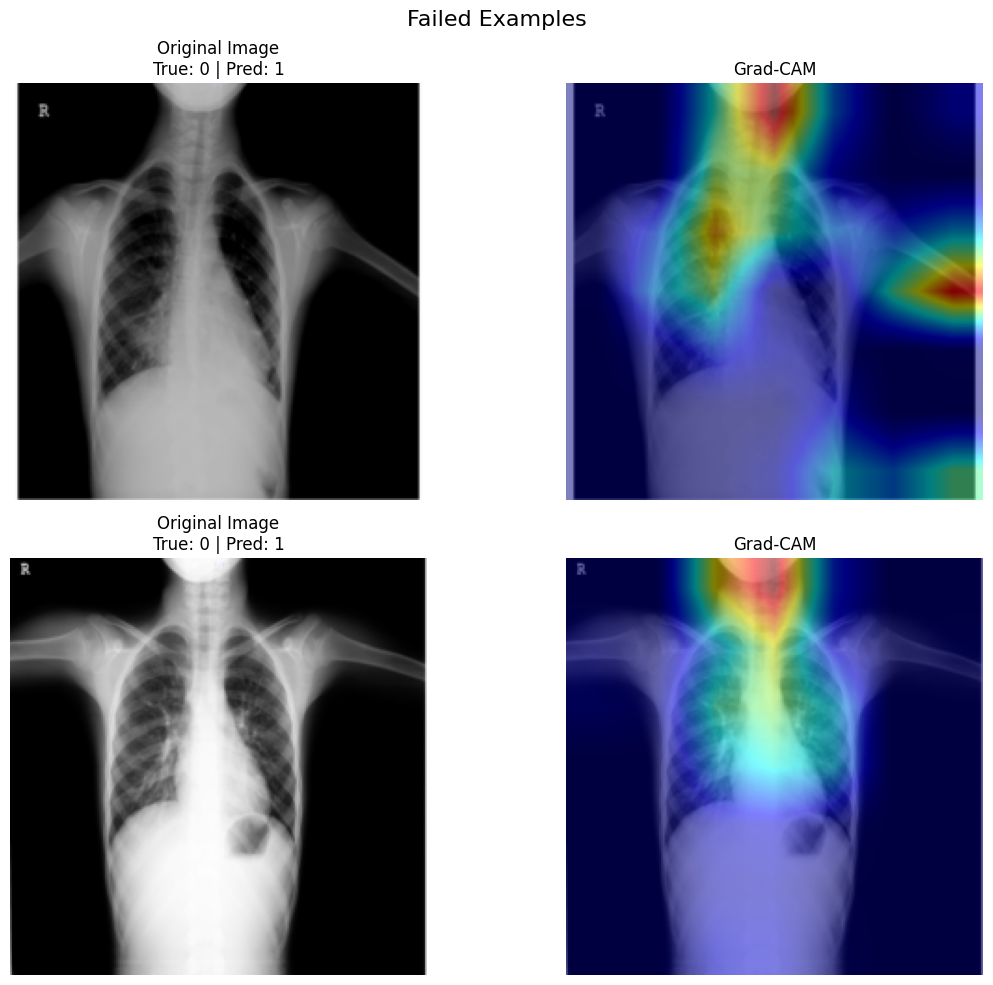


Evaluating CustomCNN...
Total samples processed: 144


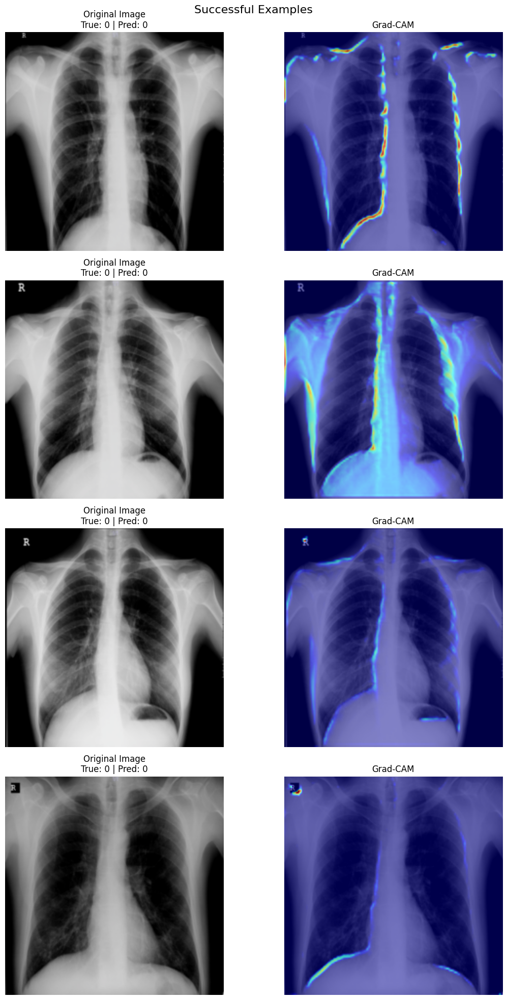

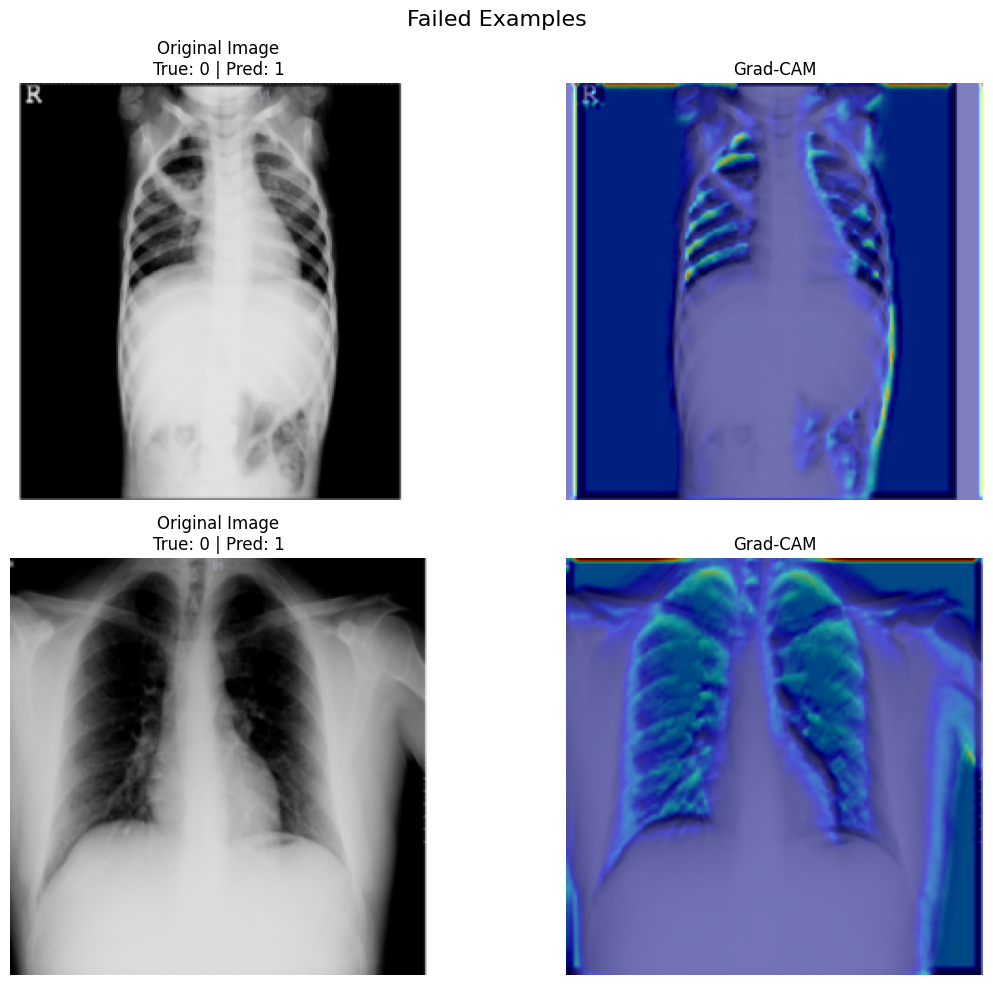

In [ ]:
def load_real_world_data(data_dir, batch_size=32):
    """
    Load real-world data for testing models.
    """
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize images to 224x224 for model compatibility
        transforms.ToTensor(),         # Convert image to PyTorch tensor
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize using ImageNet mean and std
    ])
    dataset = datasets.ImageFolder(data_dir, transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=2)  # Reduced worker count
    return dataloader, dataset.classes


def test_real_world_models(model_configs, real_dataloader, real_classes):
    """
    Test all models on real-world data.
    """
    print("\nTesting models on Real World Data:")
    real_world_metrics = {}

    for name, (model, weights_path, get_target_layer) in model_configs.items():
        print(f"\nEvaluating {name}...")

        try:
            # Load pre-trained model weights securely
            model.load_state_dict(torch.load(weights_path, weights_only=True))
            model.to(torch.device("cuda" if torch.cuda.is_available() else "cpu"))
        except Exception as e:
            print(f"Failed to load weights for {name}: {e}")
            continue

        metrics = visualize_model_predictions(
            model,
            real_dataloader,
            real_classes,
            get_target_layer(model)
        )

        if metrics is None:
            print(f"Warning: {name} returned None for metrics.")
        else:
            real_world_metrics[name] = metrics

    # Remove models with None metrics
    real_world_metrics = {k: v for k, v in real_world_metrics.items() if v is not None}

    return real_world_metrics


def visualize_model_predictions(model, dataloader, class_names, target_layer):
    """
    Visualize Grad-CAM for successful and failed predictions.
    """
    model.eval()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    all_preds = []
    all_labels = []
    all_images = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            try:
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
            except Exception as e:
                print(f"Error during forward pass: {e}")
                return None

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_images.extend(inputs.cpu())

    if not all_preds or not all_labels or not all_images:
        print("Error: Predictions, labels, or images are empty.")
        return None

    print(f"Total samples processed: {len(all_images)}")
    all_images = torch.stack(all_images)
    all_labels = torch.tensor(all_labels)
    all_preds = torch.tensor(all_preds)

    # Indices for correct and incorrect predictions
    correct_idx = (all_preds == all_labels).nonzero(as_tuple=True)[0]
    incorrect_idx = (all_preds != all_labels).nonzero(as_tuple=True)[0]

    # Select 4 successful and 2 failed examples
    successful_samples = correct_idx[torch.randperm(len(correct_idx))[:4]] if len(correct_idx) >= 4 else correct_idx
    failed_samples = incorrect_idx[torch.randperm(len(incorrect_idx))[:2]] if len(incorrect_idx) >= 2 else incorrect_idx

    # Apply Grad-CAM for successful examples
    if len(successful_samples) > 0:
        apply_grad_cam(
            model,
            all_images[successful_samples],
            all_labels[successful_samples],
            all_preds[successful_samples],
            target_layer,
            "Successful Examples"
        )

    # Apply Grad-CAM for failed examples
    if len(failed_samples) > 0:
        apply_grad_cam(
            model,
            all_images[failed_samples],
            all_labels[failed_samples],
            all_preds[failed_samples],
            target_layer,
            "Failed Examples"
        )

    return {
        'accuracy': accuracy_score(all_labels, all_preds),
        'precision': precision_score(all_labels, all_preds, average='weighted', zero_division=0),
        'recall': recall_score(all_labels, all_preds, average='weighted', zero_division=0),
        'f1': f1_score(all_labels, all_preds, average='weighted', zero_division=0),
    }


# Load real-world dataset
real_world_dir = '/content/drive/MyDrive/RAPOR-GRAFI'
real_dataloader, real_classes = load_real_world_data(real_world_dir)

# Test all models on real-world dataset using model_configs
real_world_metrics = test_real_world_models(model_configs, real_dataloader, real_classes)